In [1]:
# Import Required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.ensemble import IsolationForest
from statsmodels.tsa.arima.model import ARIMA
from sklearn.linear_model import LinearRegression
import warnings
warnings.filterwarnings('ignore')

In [2]:
biom_df = pd.read_csv('bio_df.csv')

In [3]:
biom_df.shape

(1861107, 8)

In [4]:
len(biom_df.state.value_counts())

36

In [5]:
for state in sorted(biom_df['state'].unique()):
    districts = biom_df[biom_df['state'] == state]['district'].unique()
    print(f"{state}: {sorted(districts)}")

Andaman And Nicobar Islands: ['Nicobar', 'North And Middle Andaman', 'South Andaman']
Andhra Pradesh: ['Alluri Sitharama Raju', 'Anakapalli', 'Anantapur', 'Ananthapuramu', 'Annamayya', 'Bapatla', 'Chittoor', 'Dr. B.R. Ambedkar Konaseema', 'East Godavari', 'Eluru', 'Guntur', 'Kakinada', 'Krishna', 'Kurnool', 'Nandyal', 'Nellore', 'Ntr', 'Palnadu', 'Parvathipuram Manyam', 'Prakasam', 'Ranga Reddy', 'Sri Potti Sriramulu Nellore', 'Sri Sathya Sai', 'Srikakulam', 'Tirupati', 'Visakhapatnam', 'Vizianagaram', 'West Godavari', 'Ysr Kadapa']
Arunachal Pradesh: ['Anjaw', 'Changlang', 'Dibang Valley', 'East Kameng', 'East Siang', 'Kamle', 'Kra Daadi', 'Kurung Kumey', 'Leparada', 'Lohit', 'Longding', 'Lower Dibang Valley', 'Lower Siang', 'Lower Subansiri', 'Namsai', 'Pakke Kessang', 'Papum Pare', 'Shi Yomi', 'Siang', 'Tawang', 'Tirap', 'Upper Siang', 'Upper Subansiri', 'West Kameng', 'West Siang']
Assam: ['Bajali', 'Baksa', 'Barpeta', 'Biswanath', 'Bongaigaon', 'Cachar', 'Charaideo', 'Chirang', 'D

In [6]:
biom_df.columns

Index(['date', 'state', 'district', 'pincode', 'bio_age_5_17', 'bio_age_17_',
       'month', 'month_name'],
      dtype='object')

In [7]:
biom_df.head()

,date,state,district,pincode,bio_age_5_17,bio_age_17_,month,month_name
0,2025-03-01,Haryana,Mahendragarh,123029,280,577,3,March
1,2025-03-01,Bihar,Madhepura,852121,144,369,3,March
2,2025-03-01,Jammu And Kashmir,Punch,185101,643,1091,3,March
3,2025-03-01,Bihar,Bhojpur,802158,256,980,3,March
4,2025-03-01,Tamil Nadu,Madurai,625514,271,815,3,March


In [8]:
biom_df.month_name.value_counts()

month_name
December     543758
November     459085
September    416846
October      331715
July          22169
June          21991
May           21987
March         21953
April         21603
Name: count, dtype: int64

In [9]:
# View duplicate rows in biom_df
duplicate_rows = biom_df[biom_df.duplicated()]
duplicate_rows

,date,state,district,pincode,bio_age_5_17,bio_age_17_,month,month_name
110000,2025-09-01,Chhattisgarh,Kondagaon,494229,0,1,9,September
110001,2025-09-01,Chhattisgarh,Kondagaon,494230,1,0,9,September
110002,2025-09-01,Chhattisgarh,Korba,495119,5,35,9,September
110003,2025-09-01,Chhattisgarh,Korba,495446,0,16,9,September
110004,2025-09-01,Chhattisgarh,Korba,495674,10,34,9,September
...,...,...,...,...,...,...,...,...
1860710,2025-12-29,Telangana,Rangareddy,500005,2,1,12,December
1860949,2025-12-29,West Bengal,Malda,732142,0,3,12,December
1861044,2025-12-29,West Bengal,Purba Bardhaman,713131,1,0,12,December
1861086,2025-12-29,West Bengal,South 24 Parganas,743371,0,2,12,December


110001	2025-09-01	Chhattisgarh	Kondagaon	494230	1	0	9	September

In [12]:
# Filtering the dataframe for the specific row
target_row = biom_df[
    (biom_df['state'] == 'Chhattisgarh') & 
    (biom_df['district'] == 'Korba') & 
    (biom_df['pincode'] == 495119) & 
    (biom_df['bio_age_5_17'] == 5) & 
    (biom_df['bio_age_17_'] == 35) &
    (biom_df['month_name'] == 'September')
]

# Display the result
print(target_row)

              date         state district  pincode  bio_age_5_17  bio_age_17_  \
109996  2025-09-01  Chhattisgarh    Korba   495119             5           35   
110002  2025-09-01  Chhattisgarh    Korba   495119             5           35   

        month month_name  
109996      9  September  
110002      9  September  


The month with the most Biometric updates is July with 9792552 updates.


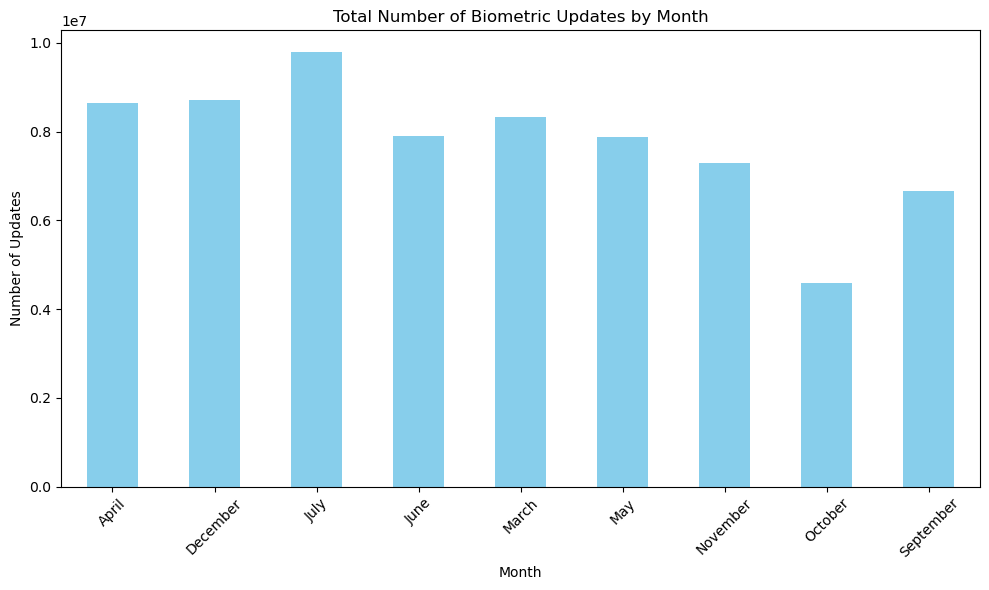

In [13]:
# Analyze monthly demographic updates
monthly_updates = biom_df.groupby('month_name')[['bio_age_5_17', 'bio_age_17_']].sum().sum(axis=1).sort_index()

# Find the month with the most updates
most_updates_month = monthly_updates.idxmax()
most_updates_count = monthly_updates.max()

print(f"The month with the most Biometric updates is {most_updates_month} with {most_updates_count} updates.")

# Visualize the monthly updates
plt.figure(figsize=(10, 6))
monthly_updates.plot(kind='bar', color='skyblue')
plt.title('Total Number of Biometric Updates by Month')
plt.xlabel('Month')
plt.ylabel('Number of Updates')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [56]:
# Overall biometrics update by month
overall_enrollments = biom_df.groupby('month_name')[['bio_age_5_17', 'bio_age_17_']].sum().sum(axis=1).reset_index()
overall_enrollments.columns = ['month_name', 'total_biometrics_updates']

# Sort by month order
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
overall_enrollments['month_name'] = pd.Categorical(overall_enrollments['month_name'], categories=month_order, ordered=True)
overall_enrollments = overall_enrollments.sort_values('month_name')

# Line plot
fig = px.line(overall_enrollments, x='month_name', y='total_biometrics_updates', 
              title='Overall biometrics update by Month',
              labels={'month_name': 'Month', 'total_biometrics_updates': 'Total Biometrics Updates'})
fig.update_layout(xaxis_title='Month', yaxis_title='Total Biometrics Updates')
fig.show()

Monthly sums for age groups:
            bio_age_5_17  bio_age_17_
month_name                           
April            4356896      4284783
December         4624160      4080148
July             4499057      5293495
June             3710149      4189140
March            3733578      4588644
May              3868247      4011709
November         3608891      3676614
October          2215380      2367275
September        3610497      3044431


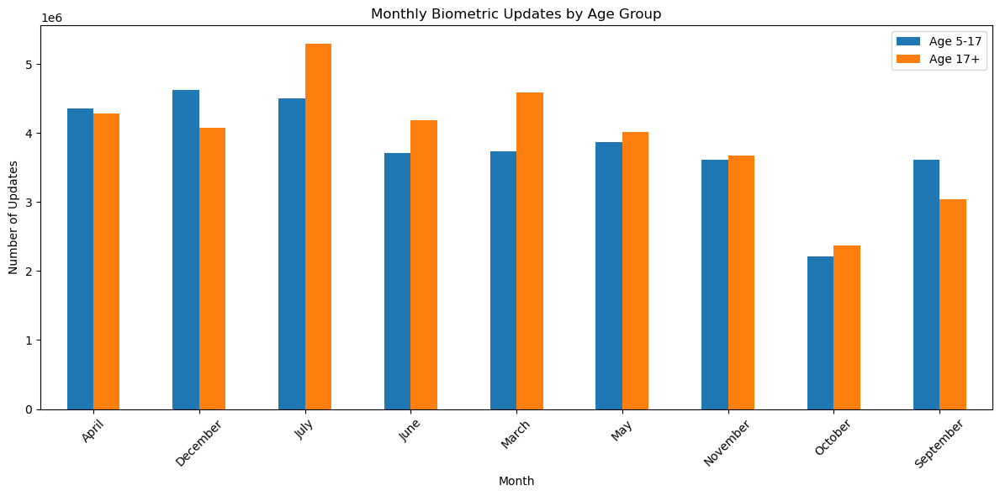

In [14]:
# Group by month and sum the age groups
monthly_age_groups = biom_df.groupby('month_name')[['bio_age_5_17', 'bio_age_17_']].sum().sort_index()

print("Monthly sums for age groups:")
print(monthly_age_groups)

# Visualize
monthly_age_groups.plot(kind='bar', figsize=(12, 6))
plt.title('Monthly Biometric Updates by Age Group')
plt.xlabel('Month')
plt.ylabel('Number of Updates')
plt.legend(['Age 5-17', 'Age 17+'])
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

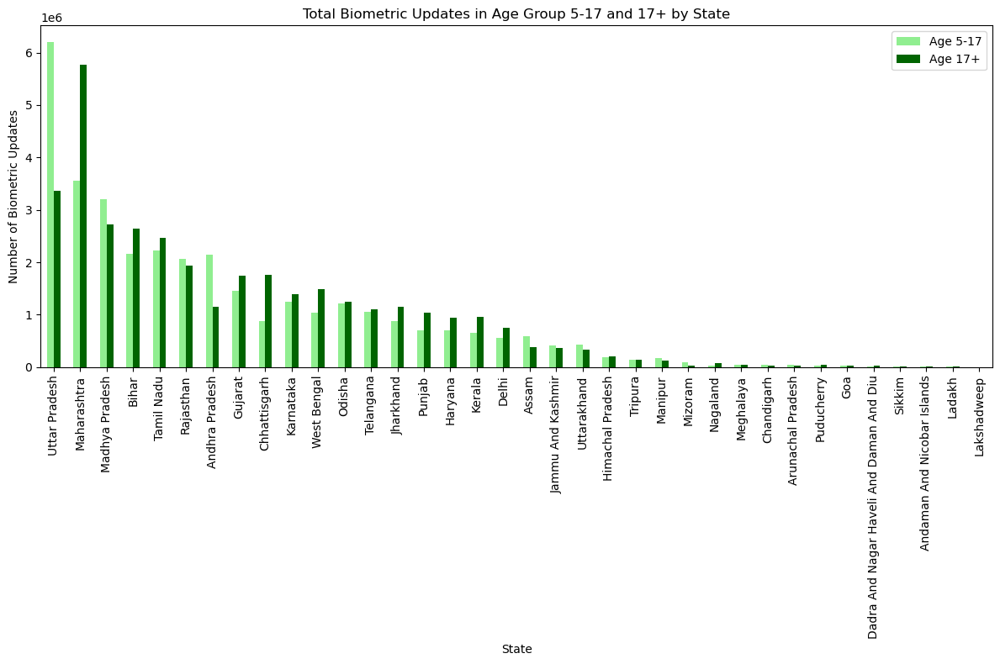

In [18]:
# 1. Aggregate
age_by_state = biom_df.groupby('state')[['bio_age_5_17', 'bio_age_17_']].sum()

# 2. Sort by the sum of both columns
age_by_state = age_by_state.assign(total=age_by_state.sum(axis=1)).sort_values(by='total', ascending=False).drop(columns='total')

# 3. Plot (using two colors to distinguish the groups)
plt.figure(figsize=(12, 8))
age_by_state.plot(kind='bar', color=['lightgreen', 'darkgreen'], ax=plt.gca()) # ax=plt.gca() keeps it in the figure
plt.title('Total Biometric Updates in Age Group 5-17 and 17+ by State')
plt.xlabel('State')
plt.ylabel('Number of Biometric Updates')
plt.xticks(rotation=90)
plt.legend(["Age 5-17", "Age 17+"])
plt.tight_layout()
plt.show()

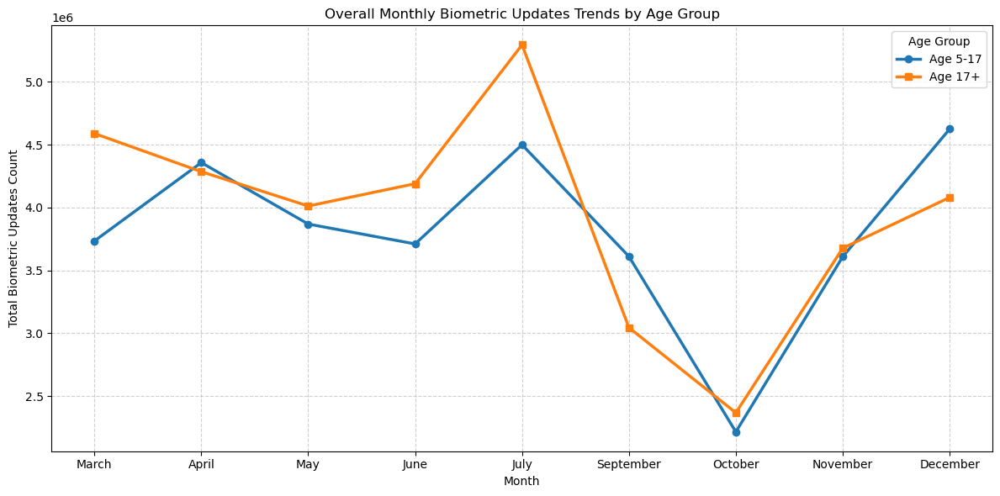

In [20]:
df = pd.read_csv('bio_df.csv')

# Group by month and sum the counts for all age groups
monthly_trends = df.groupby(['month', 'month_name'])[['bio_age_5_17', 'bio_age_17_']].sum().reset_index()

# Sort by month to ensure chronological order
monthly_trends = monthly_trends.sort_values('month')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(monthly_trends['month_name'], monthly_trends['bio_age_5_17'], marker='o', label='Age 5-17', linewidth=2.5)
plt.plot(monthly_trends['month_name'], monthly_trends['bio_age_17_'], marker='s', label='Age 17+', linewidth=2.5)

plt.title('Overall Monthly Biometric Updates Trends by Age Group')
plt.xlabel('Month')
plt.ylabel('Total Biometric Updates Count')
plt.legend(title='Age Group')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

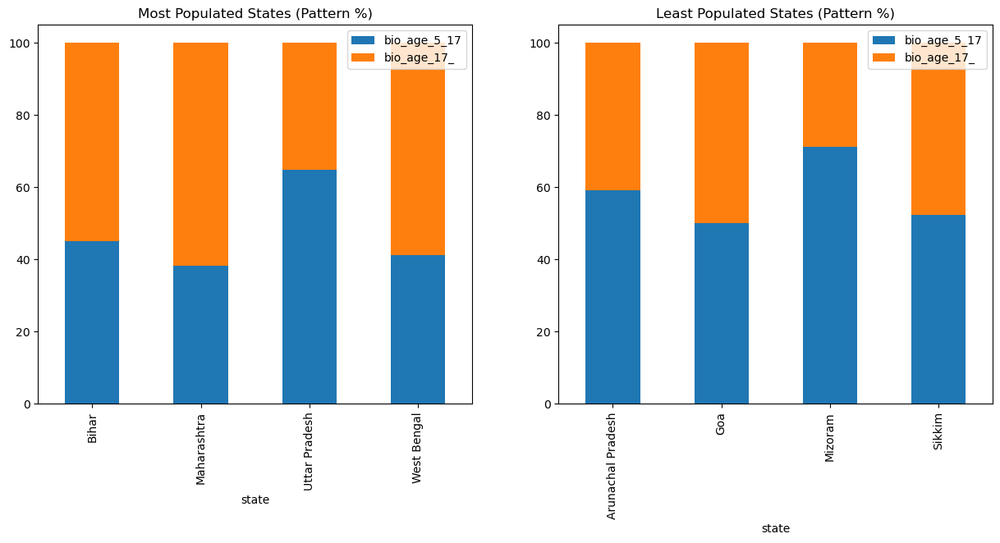

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('bio_df.csv')

# Defining States based on current (2024/2025) Population Rankings
most_populated = ['Uttar Pradesh', 'Bihar', 'Maharashtra', 'West Bengal']
least_populated = ['Sikkim', 'Mizoram', 'Arunachal Pradesh', 'Goa']

# Aggregating and Calculating Percentages for Patterns
def get_patterns(state_list):
    subset = df[df['state'].isin(state_list)]
    agg = subset.groupby('state')[['bio_age_5_17', 'bio_age_17_']].sum()
    return agg.div(agg.sum(axis=1), axis=0) * 100

most_pop_patterns = get_patterns(most_populated)
least_pop_patterns = get_patterns(least_populated)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
most_pop_patterns.plot(kind='bar', stacked=True, ax=axes[0], title='Most Populated States (Pattern %)')
least_pop_patterns.plot(kind='bar', stacked=True, ax=axes[1], title='Least Populated States (Pattern %)')
plt.show()

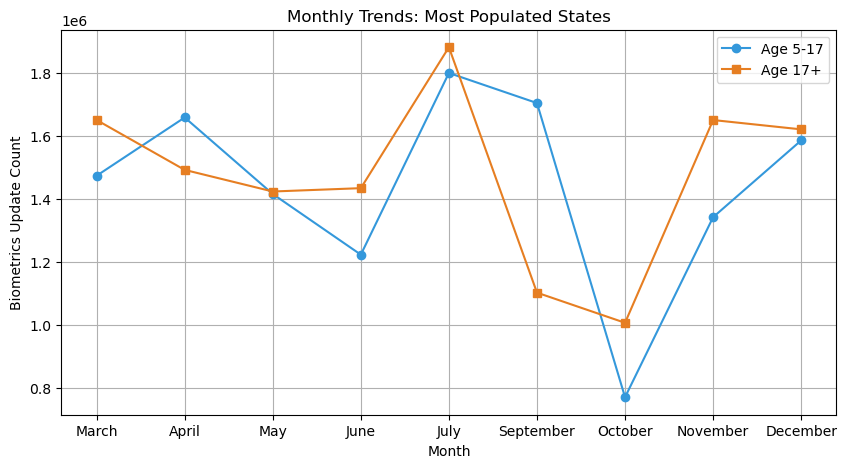

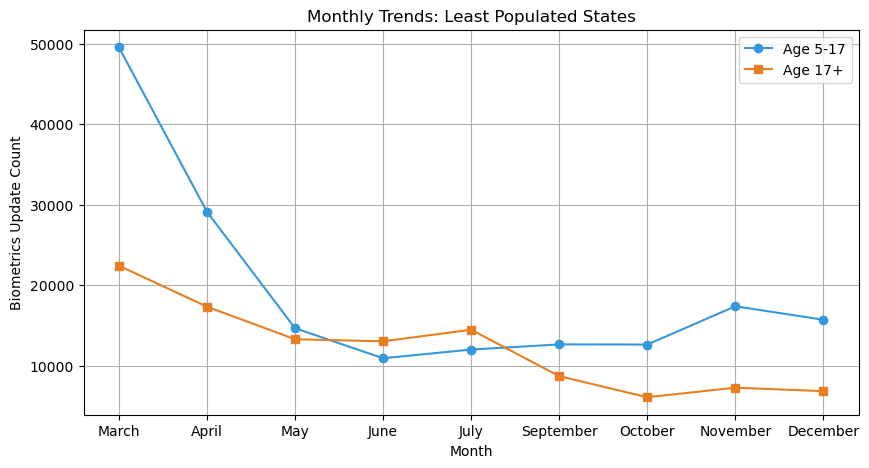

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
df = pd.read_csv('bio_df.csv')

# Define state groups based on current population
most_pop = ['Uttar Pradesh', 'Bihar', 'Maharashtra', 'West Bengal']
least_pop = ['Sikkim', 'Mizoram', 'Arunachal Pradesh', 'Goa']

# Prepare data function
def get_pop_trend(states):
    subset = df[df['state'].isin(states)]
    return subset.groupby(['month', 'month_name'])[['bio_age_5_17', 'bio_age_17_']].sum().reset_index().sort_values('month')

most_pop_trend = get_pop_trend(most_pop)
least_pop_trend = get_pop_trend(least_pop)

# Plotting function
def plot_pop_trend(data, title):
    plt.figure(figsize=(10, 5))
    plt.plot(data['month_name'], data['bio_age_5_17'], marker='o', label='Age 5-17', color='#3498db')
    plt.plot(data['month_name'], data['bio_age_17_'], marker='s', label='Age 17+', color='#e67e22')
    plt.title(title)
    plt.xlabel('Month')
    plt.ylabel('Biometrics Update Count')
    plt.legend()
    plt.grid(True)
    plt.show()

# Visualize
plot_pop_trend(most_pop_trend, 'Monthly Trends: Most Populated States')
plot_pop_trend(least_pop_trend, 'Monthly Trends: Least Populated States')

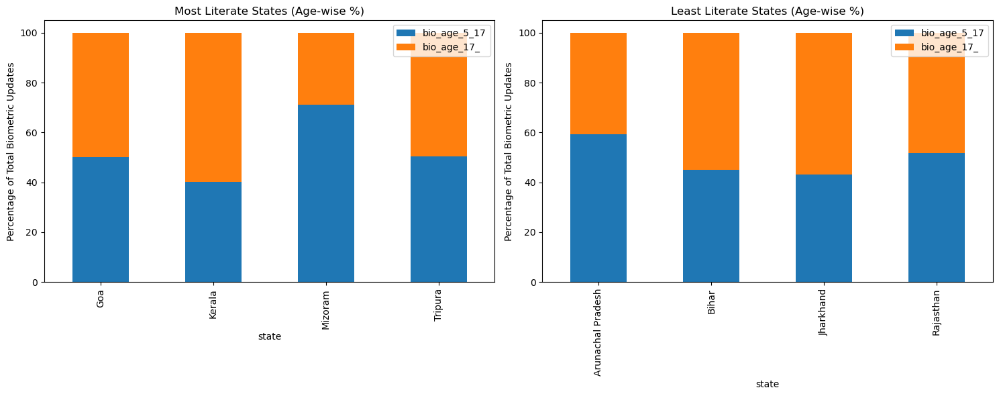

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('bio_df.csv')

# Define groups based on real-world literacy rankings
most_literate = ['Kerala', 'Mizoram', 'Goa', 'Tripura']
least_literate = ['Bihar', 'Arunachal Pradesh', 'Rajasthan', 'Jharkhand']

# Function to extract age-wise distribution percentage
def get_literacy_patterns(state_list):
    subset = df[df['state'].isin(state_list)]
    agg = subset.groupby('state')[['bio_age_5_17', 'bio_age_17_']].sum()
    # Convert to percentage for relative pattern analysis
    return agg.div(agg.sum(axis=1), axis=0) * 100

most_lit_pct = get_literacy_patterns(most_literate)
least_lit_pct = get_literacy_patterns(least_literate)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

most_lit_pct.plot(kind='bar', stacked=True, ax=axes[0], title='Most Literate States (Age-wise %)')
axes[0].set_ylabel('Percentage of Total Biometric Updates')

least_lit_pct.plot(kind='bar', stacked=True, ax=axes[1], title='Least Literate States (Age-wise %)')
axes[1].set_ylabel('Percentage of Total Biometric Updates')

plt.tight_layout()
plt.show()

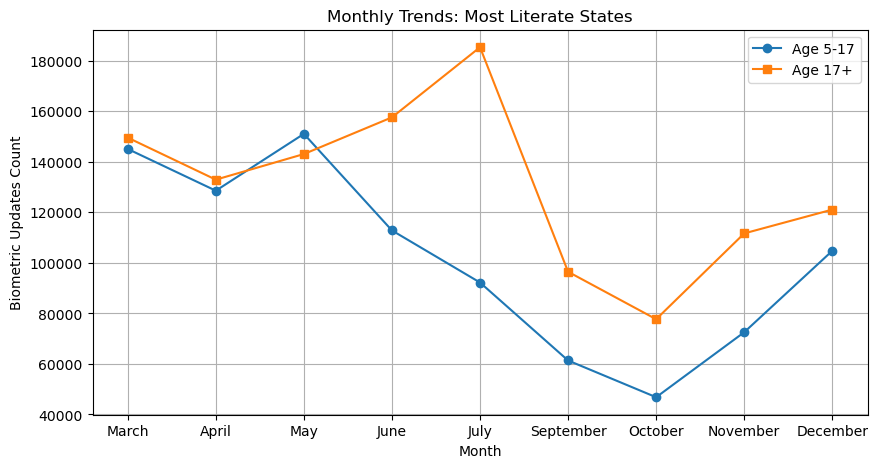

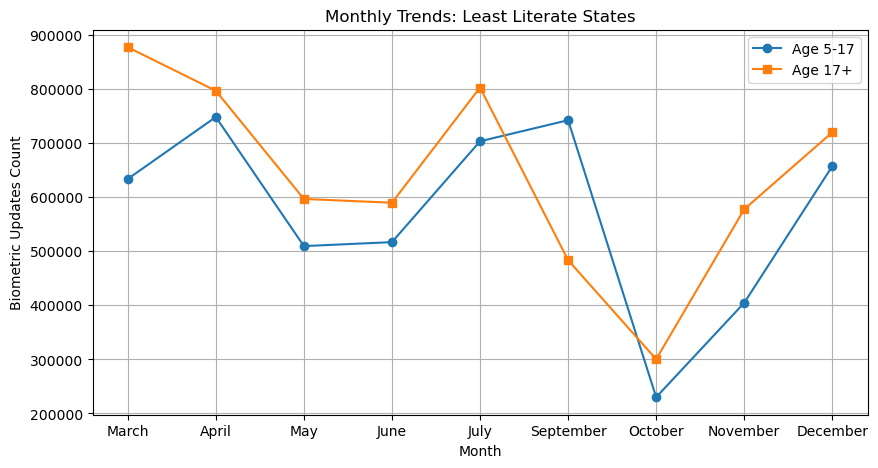

In [24]:
df = pd.read_csv('bio_df.csv')

# Define state groups
most_lit = ['Kerala', 'Mizoram', 'Goa', 'Tripura']
least_lit = ['Bihar', 'Arunachal Pradesh', 'Rajasthan', 'Jharkhand']

# Prepare data function
def get_trend(states):
    subset = df[df['state'].isin(states)]
    return subset.groupby(['month', 'month_name'])[['bio_age_5_17', 'bio_age_17_']].sum().reset_index().sort_values('month')

most_trend = get_trend(most_lit)
least_trend = get_trend(least_lit)

# Plotting Function
def plot_trend(data, title):
    plt.figure(figsize=(10, 5))
    plt.plot(data['month_name'], data['bio_age_5_17'], marker='o', label='Age 5-17')
    plt.plot(data['month_name'], data['bio_age_17_'], marker='s', label='Age 17+')
    plt.title(title)
    plt.xlabel('Month')
    plt.ylabel('Biometric Updates Count')
    plt.legend()
    plt.grid(True)
    plt.show()

# Generate Plots
plot_trend(most_trend, 'Monthly Trends: Most Literate States')
plot_trend(least_trend, 'Monthly Trends: Least Literate States')

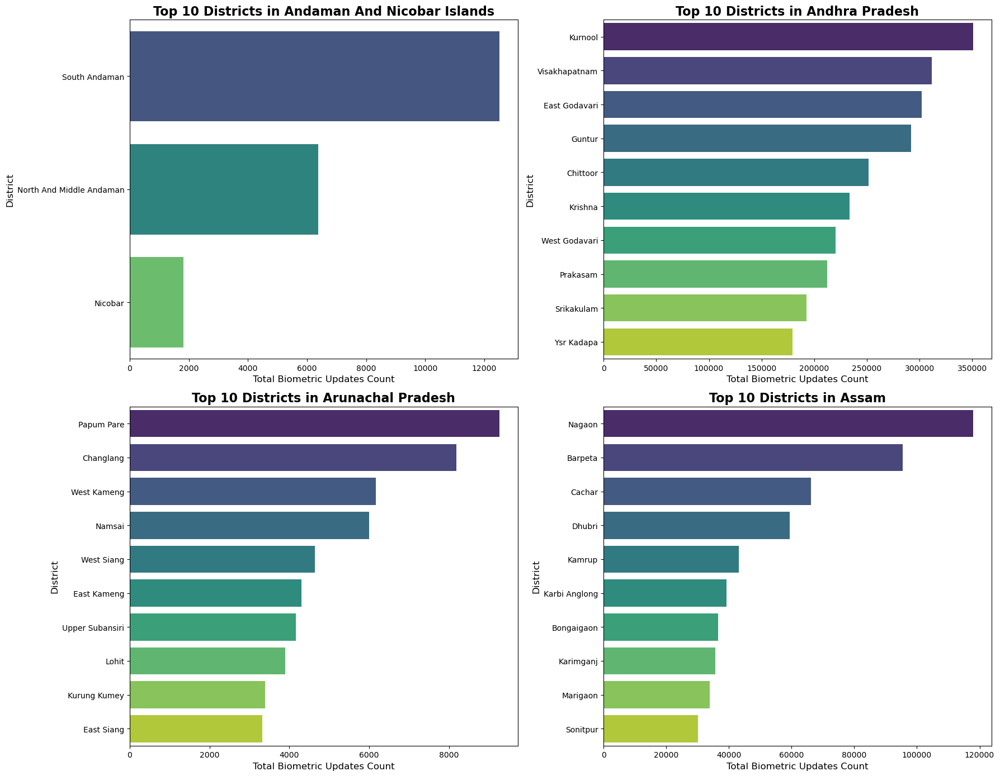

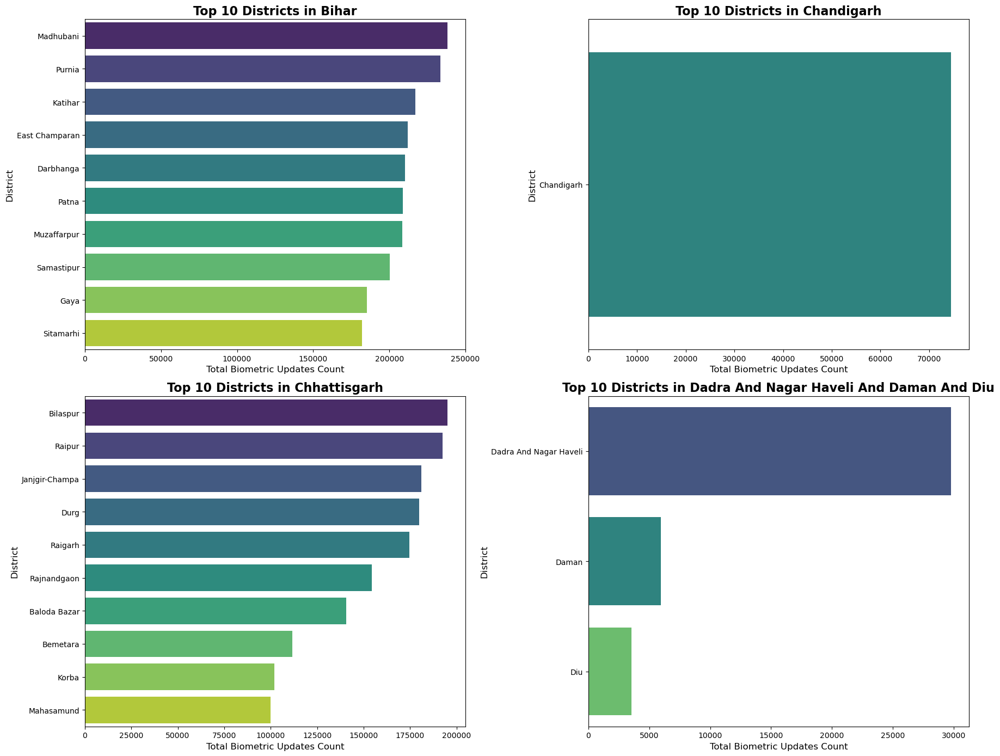

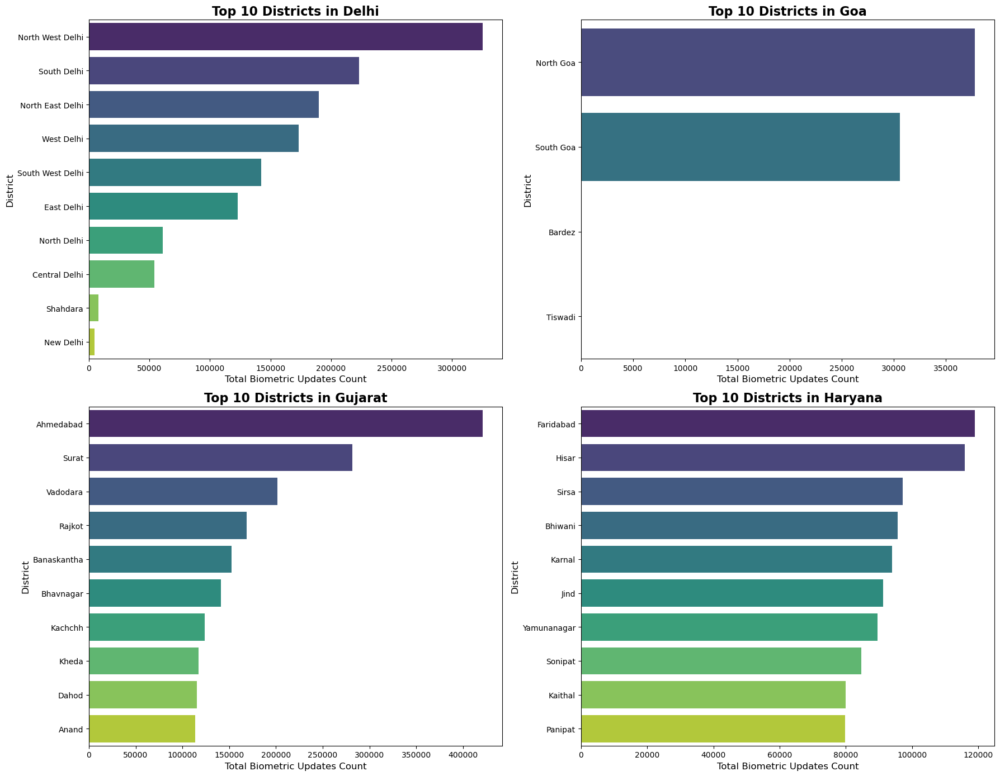

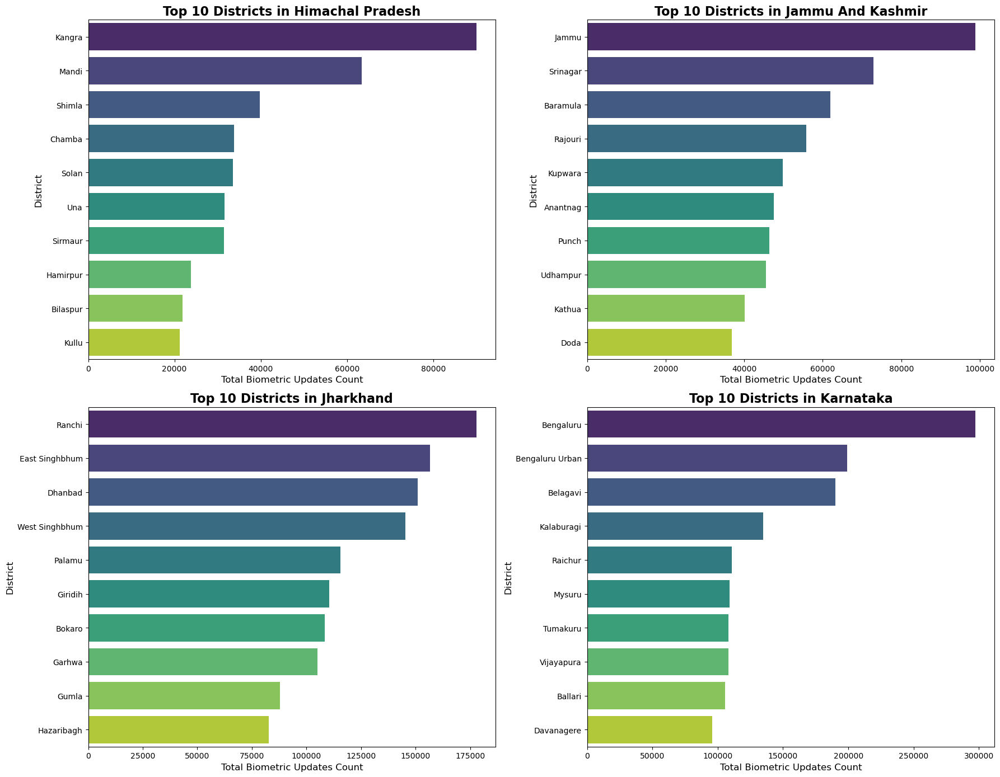

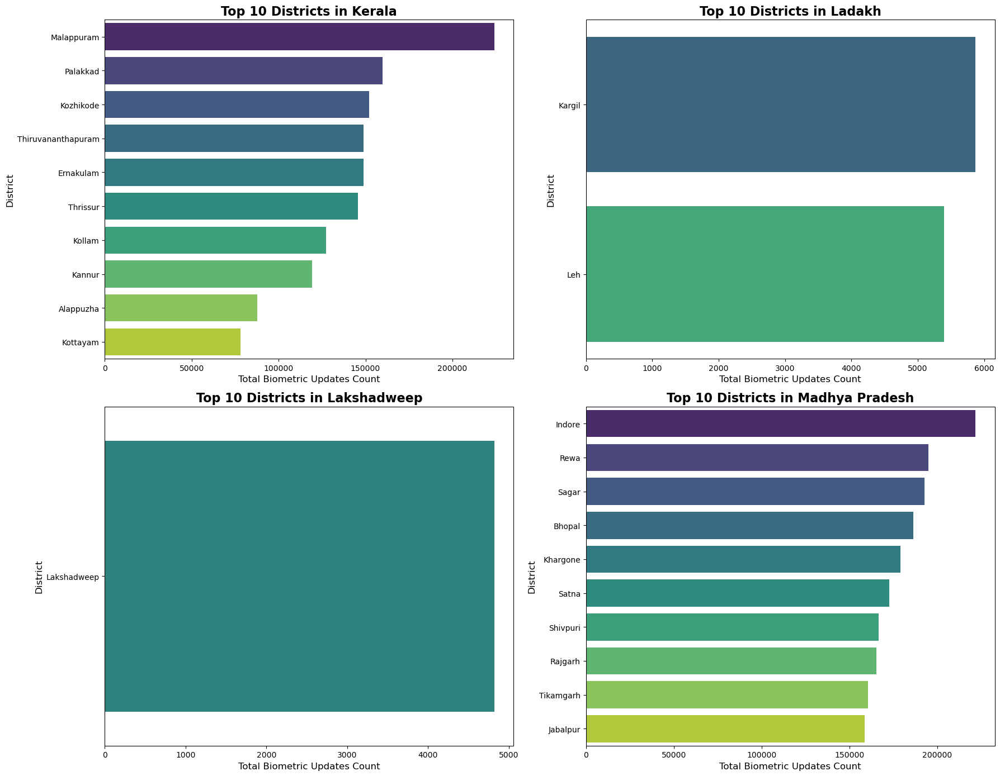

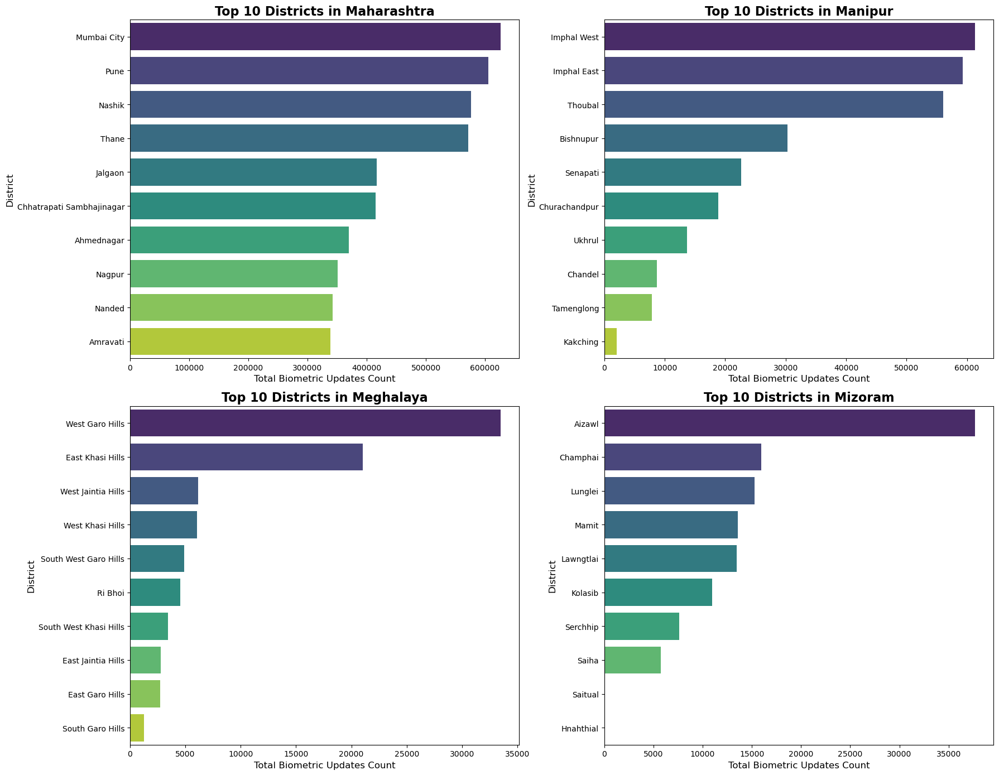

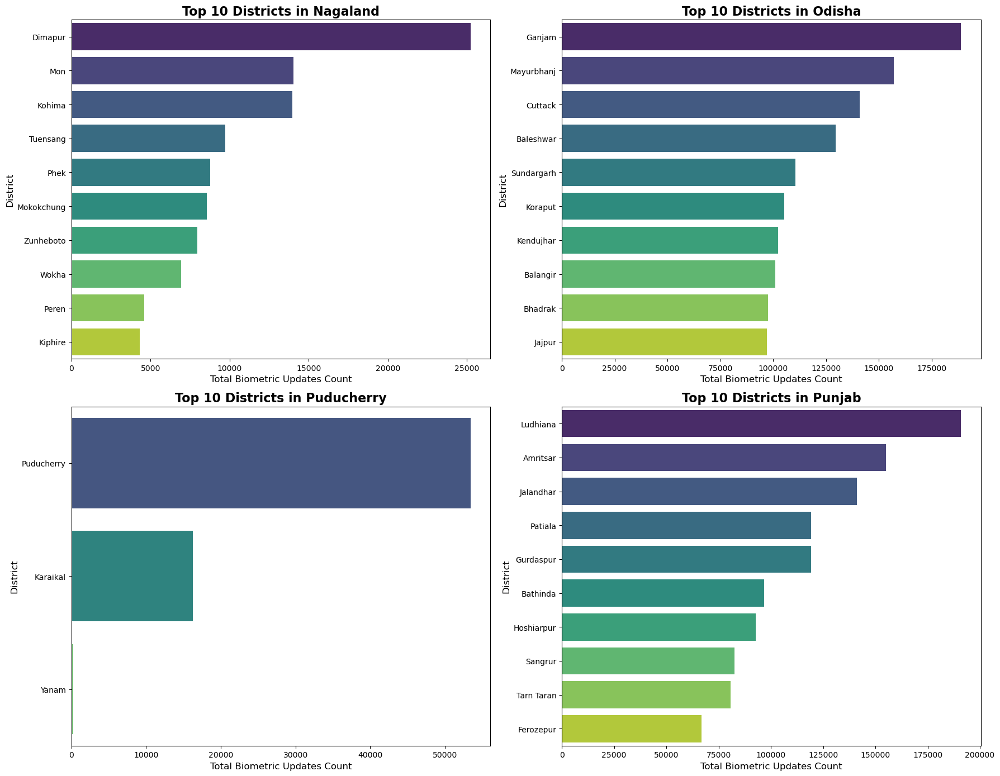

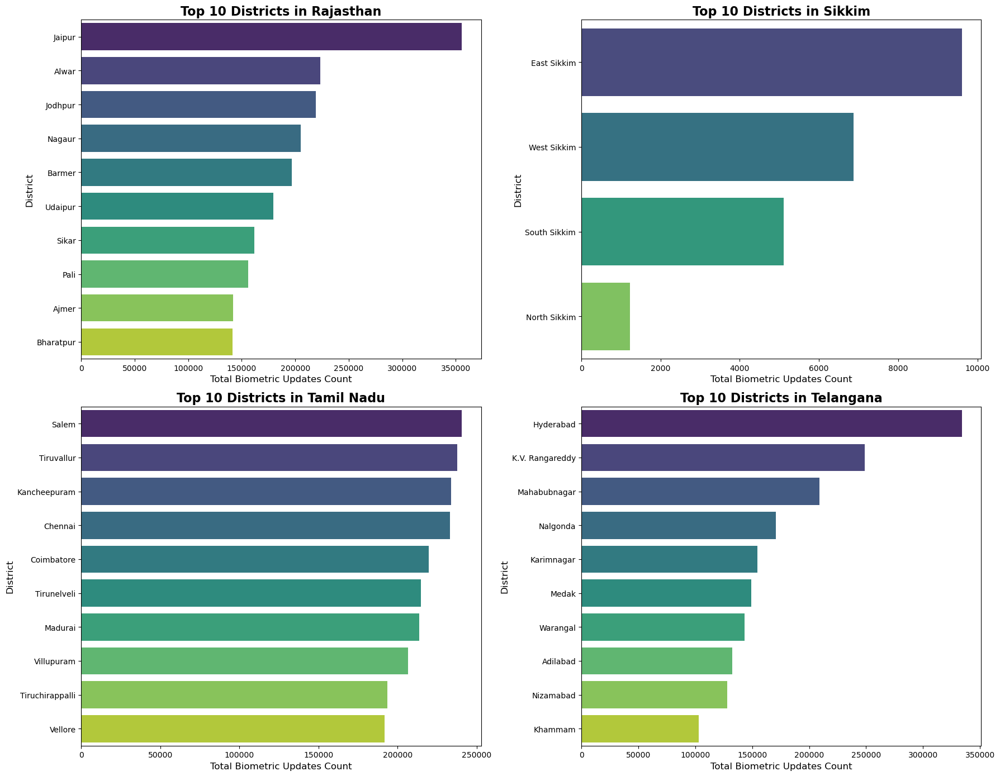

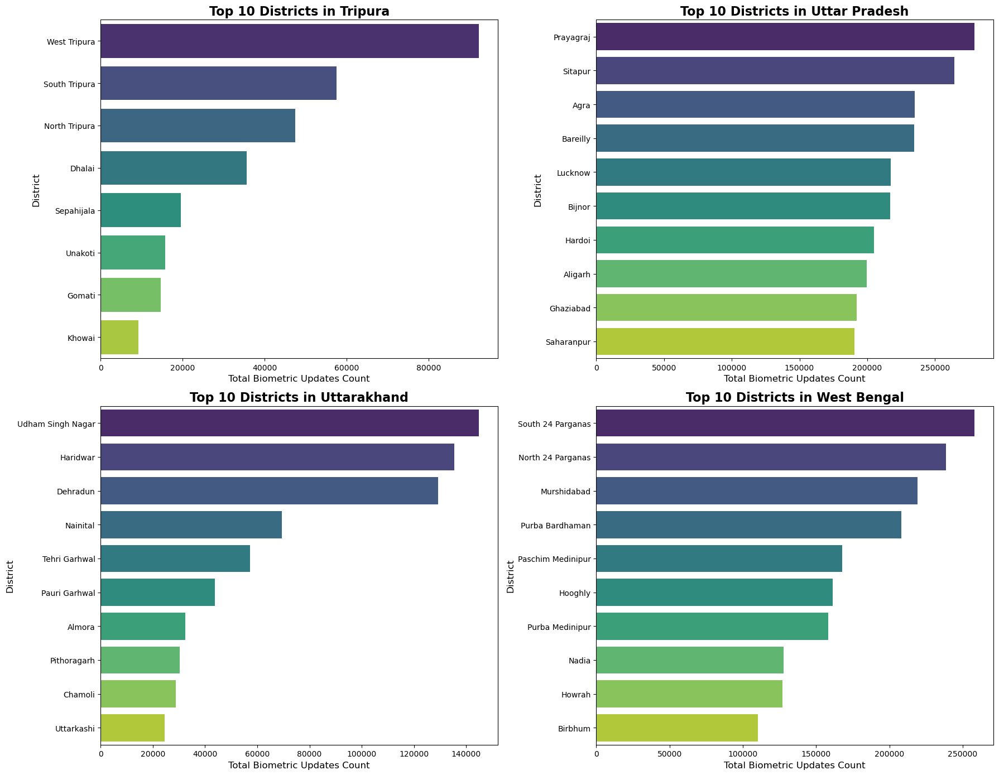

Analysis Complete. 9 batch images generated.


In [25]:
import math
df = pd.read_csv('bio_df.csv')

# 2. Pre-processing
df['total_biometric_updates'] = df['bio_age_5_17'] + df['bio_age_17_']

# 3. Aggregation
district_agg = df.groupby(['state', 'district'])['total_biometric_updates'].sum().reset_index()

# 4. Filter for Top 10
top_10_per_state = district_agg.groupby('state').apply(
    lambda x: x.nlargest(10, 'total_biometric_updates')
).reset_index(drop=True)

# 5. Visualization Setup
states = sorted(top_10_per_state['state'].unique())
num_states = len(states)
states_per_fig = 4  # Number of states to show in one image (2x2 grid)
num_figs = math.ceil(num_states / states_per_fig)

# 6. Plotting Loop
for i in range(num_figs):
    start_idx = i * states_per_fig
    end_idx = min((i + 1) * states_per_fig, num_states)
    current_states = states[start_idx:end_idx]
    
    # Initialize a 2x2 subplot grid
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    axes = axes.flatten()
    
    for j, state in enumerate(current_states):
        # Get data for the specific state
        state_data = top_10_per_state[top_10_per_state['state'] == state].sort_values('total_biometric_updates', ascending=False)
        
        # Create the bar chart
        sns.barplot(data=state_data, x='total_biometric_updates', y='district', ax=axes[j], palette='viridis')
        
        # Formatting the chart
        axes[j].set_title(f'Top 10 Districts in {state}', fontsize=16, fontweight='bold')
        axes[j].set_xlabel('Total Biometric Updates Count', fontsize=12)
        axes[j].set_ylabel('District', fontsize=12)
        
    # Remove any empty subplots in the final batch
    for k in range(len(current_states), 4):
        fig.delaxes(axes[k])
        
    plt.tight_layout()
    plt.savefig(f'top_districts_batch_{i+1}.png')
    plt.show()

print(f"Analysis Complete. {num_figs} batch images generated.")

In [26]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv('bio_df.csv')

month_order = [
    "March", "April", "May", "June",
    "July", "August", "September",
    "October", "November", "December"
]

# Convert month_name to ordered categorical
df["month_name"] = pd.Categorical(
    df["month_name"],
    categories=month_order,
    ordered=True
)

def plot_state_district_trends(state_name):

    # 1. Total biometric updates
    df["total_biometric_updates"] = (
        df['bio_age_5_17'] + df['bio_age_17_']
    )

    # 2. Aggregate total biometric updates by state & district
    district_agg = (
        df.groupby(["state", "district"])["total_biometric_updates"]
        .sum()
        .reset_index()
    )

    # 3. Select top 10 districts for the given state
    top_districts_state = (
        district_agg[district_agg["state"] == state_name]
        .nlargest(10, "total_biometric_updates")
    )

    # 4. Monthly aggregation (IMPORTANT: keep month order)
    monthly = (
        df.groupby(
            ["district", "month_name"],
            observed=True
        )[["bio_age_5_17", "bio_age_17_"]]
        .sum()
        .reset_index()
        .sort_values("month_name")
    )

    fig, axes = plt.subplots(5, 2, figsize=(18, 22))
    fig.suptitle(f"District Trends in {state_name}", fontsize=20)
    axes = axes.flatten()

    for i, dist in enumerate(top_districts_state["district"].values):
        data = monthly[monthly["district"] == dist]

        ax = axes[i]
        ax.plot(data["month_name"], data["bio_age_5_17"], marker="o", label="0-5")
        ax.plot(data["month_name"], data["bio_age_17_"], marker="s", label="5-17")

        ax.set_title(f"District: {dist}")
        ax.set_xlabel("Month")
        ax.set_ylabel("Biometric Updates")
        ax.legend()
        ax.grid(True, alpha=0.3)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()



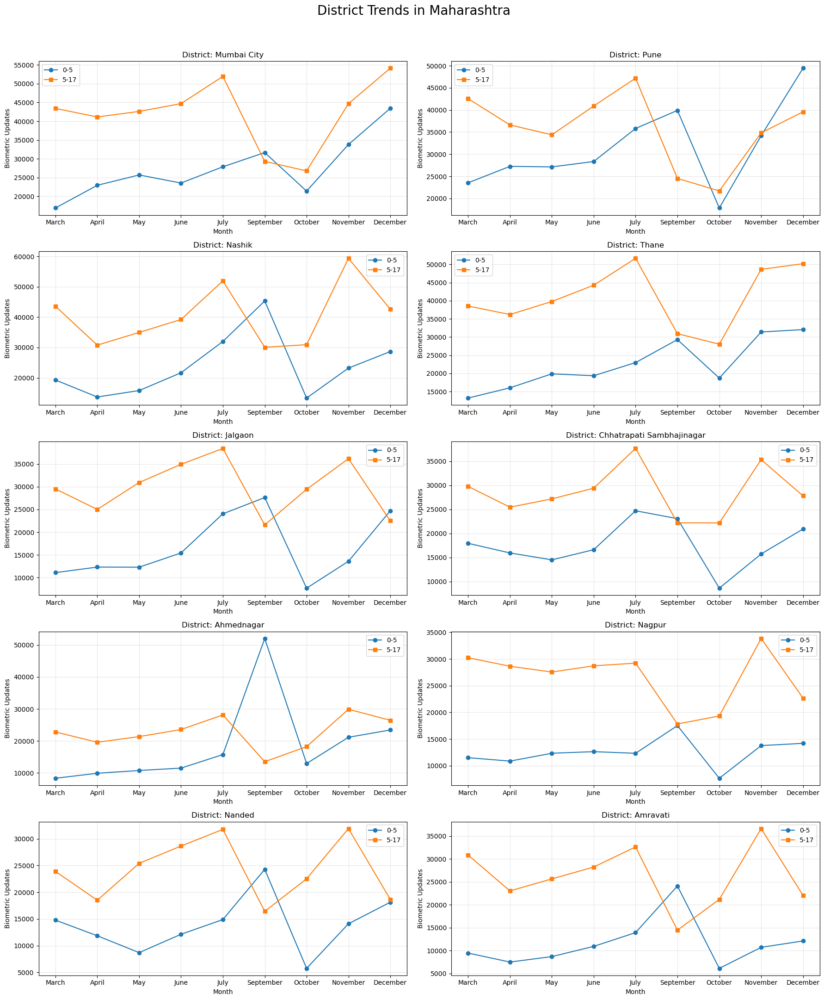

In [27]:
plot_state_district_trends("Maharashtra")

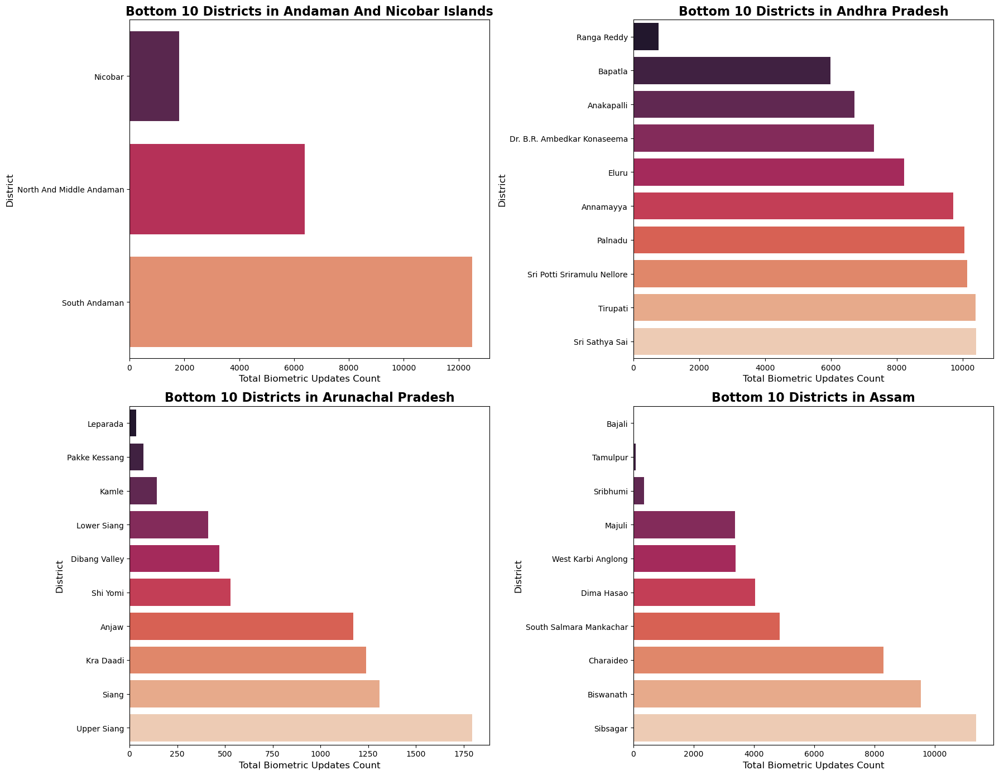

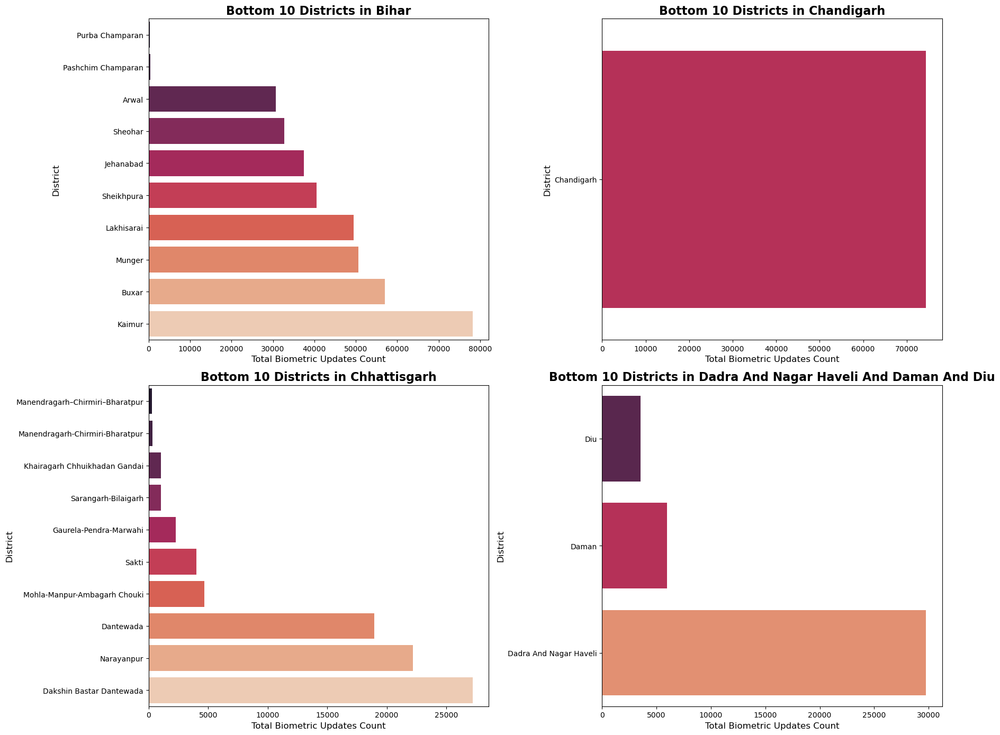

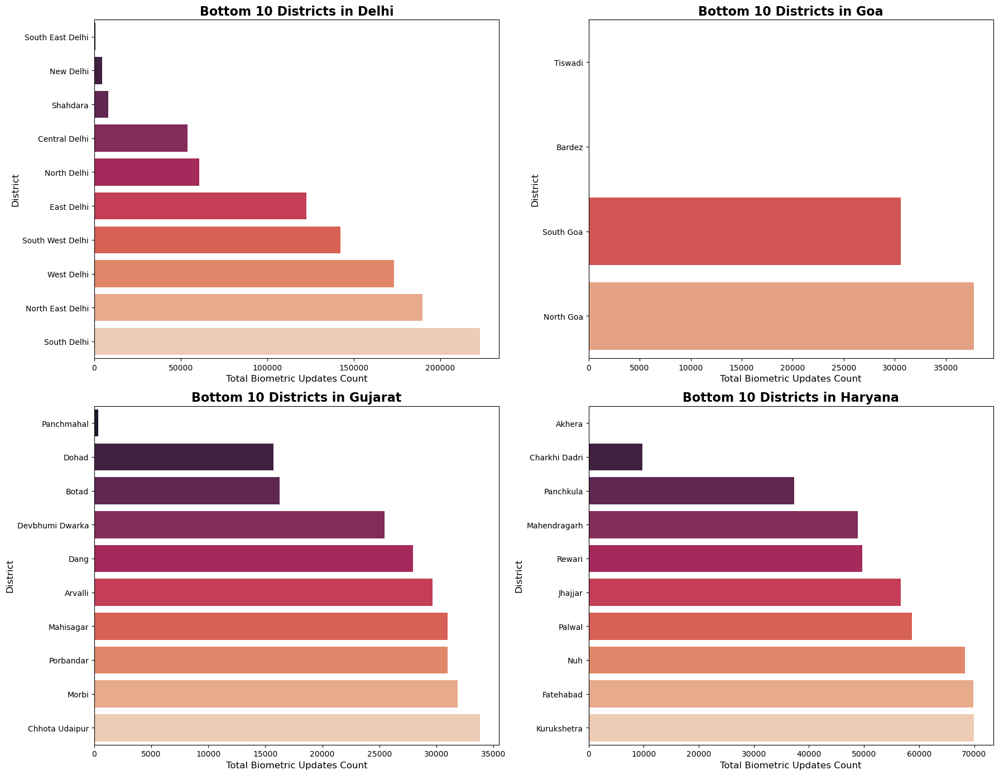

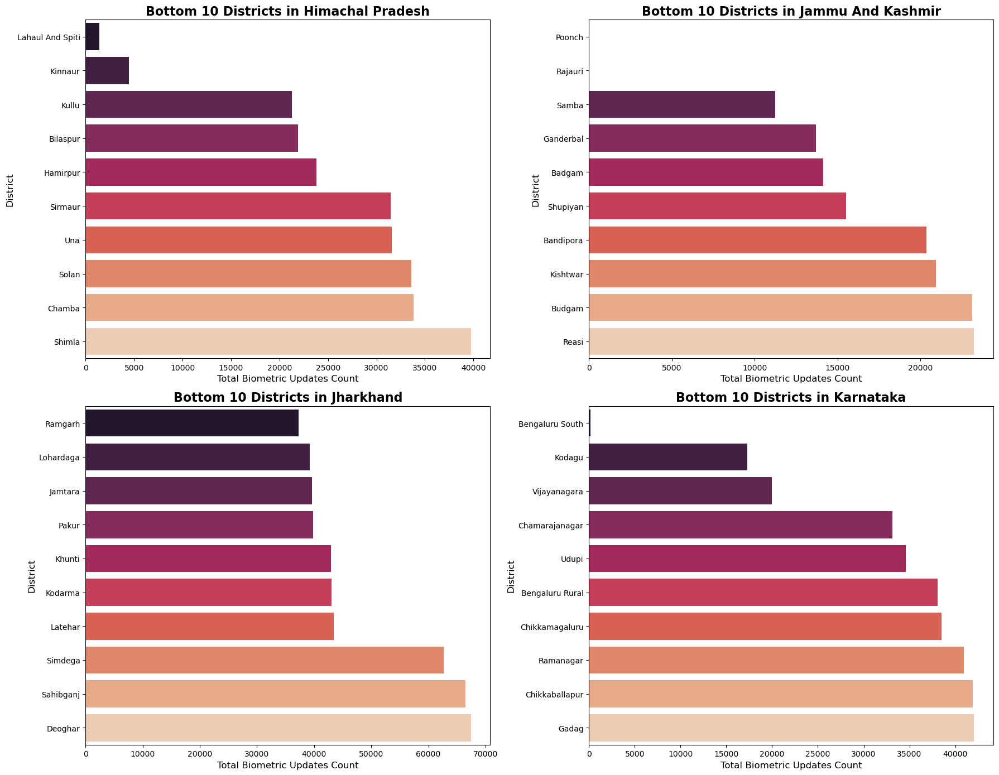

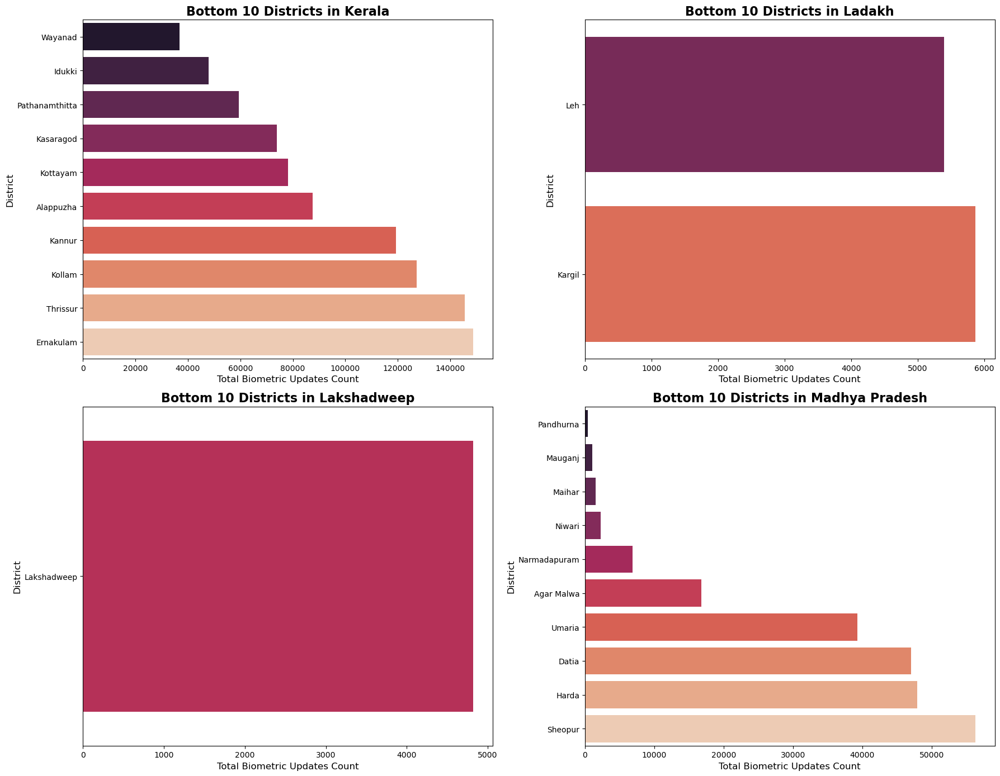

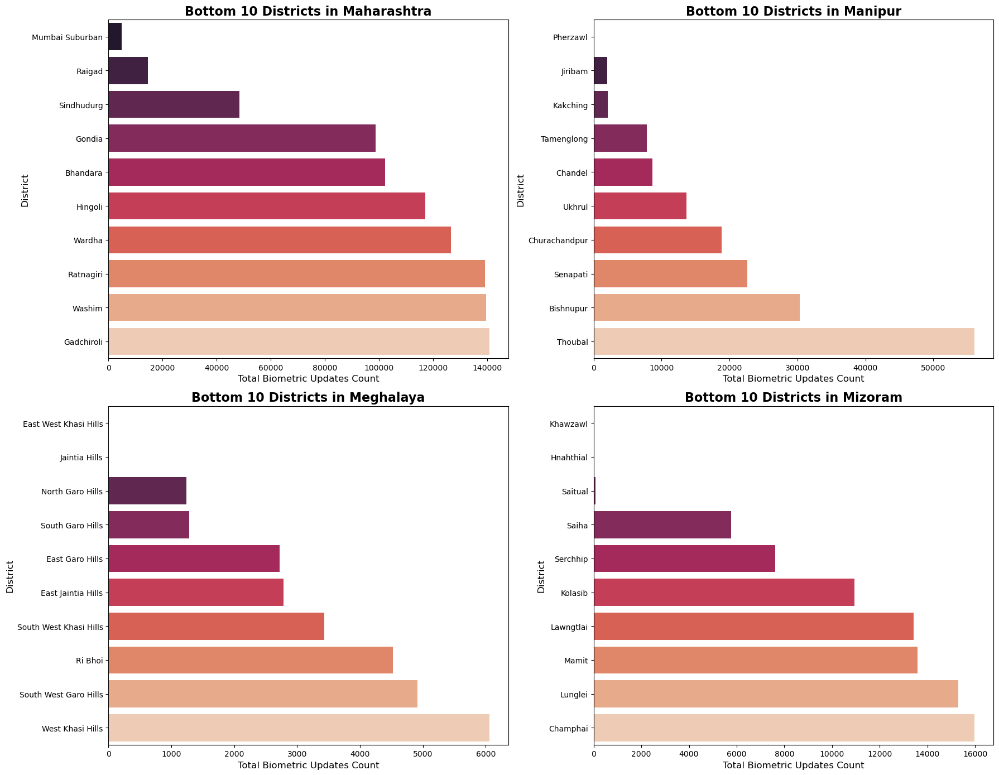

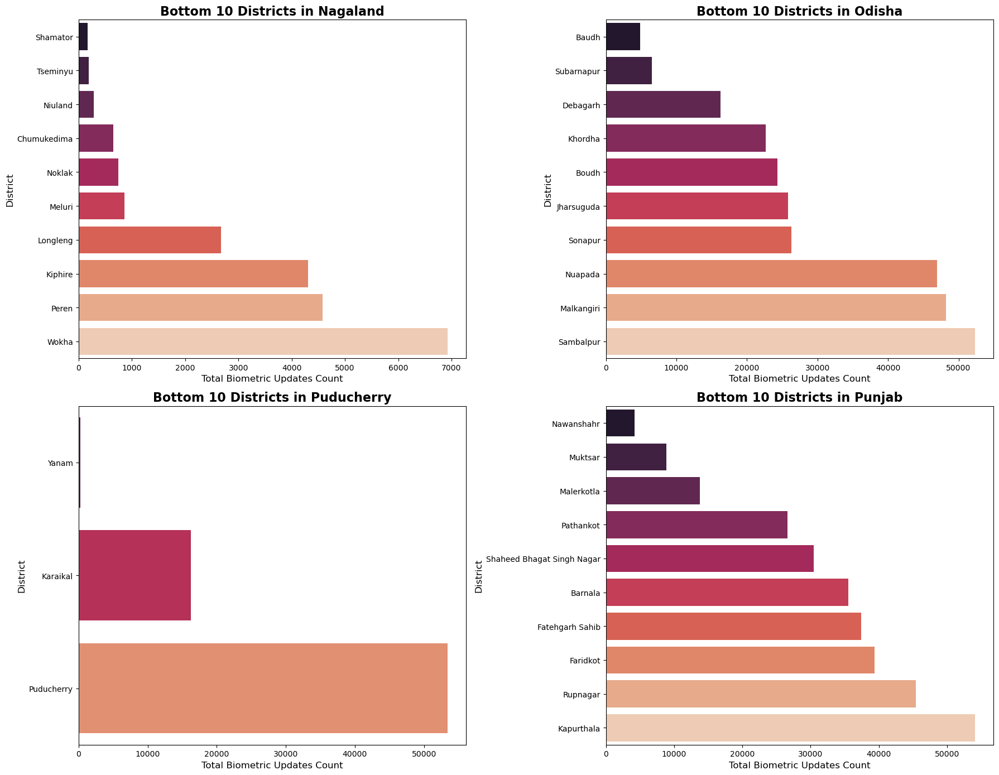

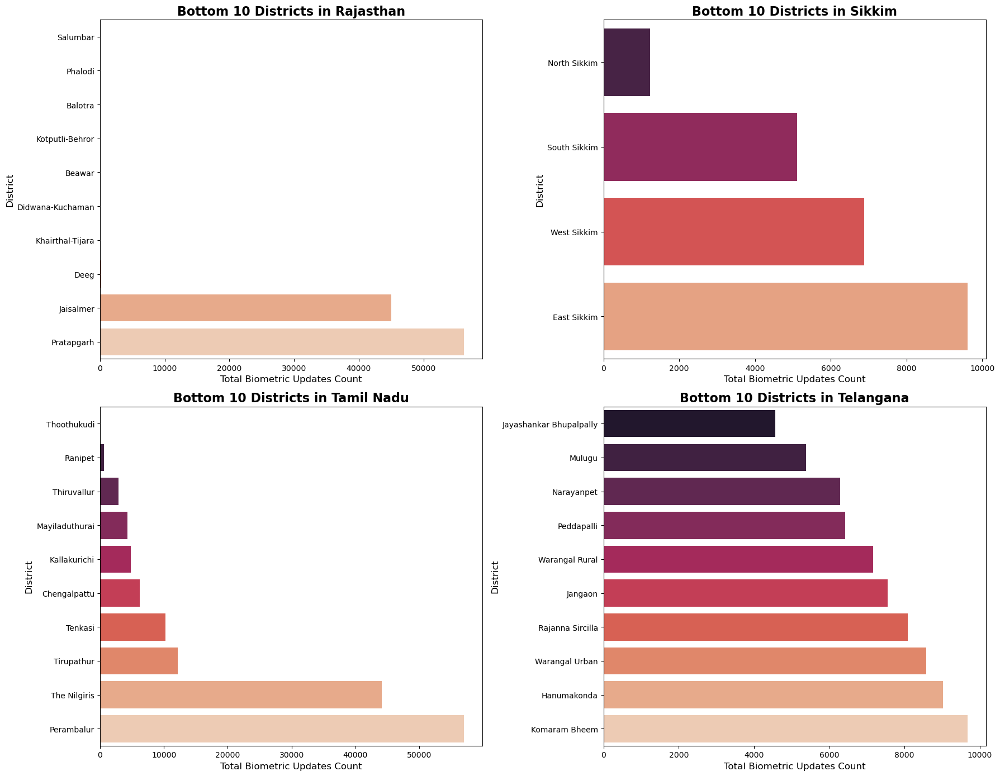

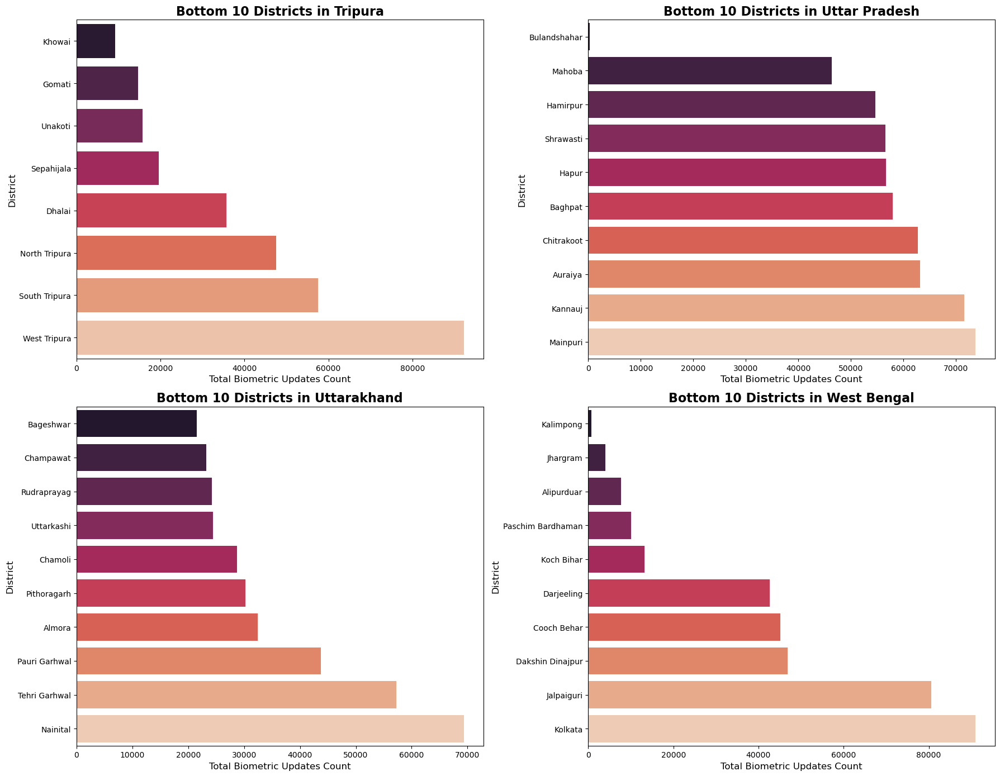

Analysis Complete. 9 batch images generated.


In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

# 1. Load the dataset
df = pd.read_csv('bio_df.csv')

# 2. Pre-processing
df['total_biometric_updates'] =  df['bio_age_5_17'] + df['bio_age_17_']

# 3. Aggregation
district_agg = df.groupby(['state', 'district'])['total_biometric_updates'].sum().reset_index()

# 4. Filter for Bottom 10 (Changed from nlargest to nsmallest)
bottom_10_per_state = district_agg.groupby('state').apply(
    lambda x: x.nsmallest(10, 'total_biometric_updates')
).reset_index(drop=True)

# 5. Visualization Setup
states = sorted(bottom_10_per_state['state'].unique())
num_states = len(states)
states_per_fig = 4 
num_figs = math.ceil(num_states / states_per_fig)

# 6. Plotting Loop
for i in range(num_figs):
    start_idx = i * states_per_fig
    end_idx = min((i + 1) * states_per_fig, num_states)
    current_states = states[start_idx:end_idx]
    
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    axes = axes.flatten()
    
    for j, state in enumerate(current_states):
        # Sort data ascending for bottom-up view
        state_data = bottom_10_per_state[bottom_10_per_state['state'] == state].sort_values('total_biometric_updates', ascending=True)
        
        # Create the bar chart
        sns.barplot(data=state_data, x='total_biometric_updates', y='district', ax=axes[j], palette='rocket')
        
        # Formatting the chart
        axes[j].set_title(f'Bottom 10 Districts in {state}', fontsize=16, fontweight='bold')
        axes[j].set_xlabel('Total Biometric Updates Count', fontsize=12)
        axes[j].set_ylabel('District', fontsize=12)
        
    for k in range(len(current_states), 4):
        fig.delaxes(axes[k])
        
    plt.tight_layout()
    plt.savefig(f'bottom_districts_batch_{i+1}.png')
    plt.show()

print(f"Analysis Complete. {num_figs} batch images generated.")

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv('bio_df.csv')

month_order = [
    "March", "April", "May", "June",
    "July", "August", "September",
    "October", "November", "December"
]

# Convert month_name to ordered categorical
df["month_name"] = pd.Categorical(
    df["month_name"],
    categories=month_order,
    ordered=True
)

def plot_state_district_bottom_trends(state_name):

    # 1. Total biometric updates
    df["total_biometric_updates"] = (
        df['bio_age_5_17'] + df['bio_age_17_']
    )

    # 2. Aggregate total biometric updates by state & district
    district_agg = (
        df.groupby(["state", "district"])["total_biometric_updates"]
        .sum()
        .reset_index()
    )

    # 3. Filter for the state and select bottom 10 districts
    bottom_10_districts = (
        district_agg[district_agg["state"] == state_name]
        .nsmallest(10, "total_biometric_updates")
    )

    # 4. Monthly aggregation (KEEP month order)
    monthly = (
        df.groupby(
            ["district", "month_name"],
            observed=True
        )[["bio_age_5_17", "bio_age_17_"]]
        .sum()
        .reset_index()
        .sort_values("month_name")
    )


    fig, axes = plt.subplots(5, 2, figsize=(18, 22))
    fig.suptitle(f"Bottom 10 District Trends in {state_name}", fontsize=20)
    axes = axes.flatten()

    for i, dist in enumerate(bottom_10_districts["district"].values):
        data = monthly[monthly["district"] == dist]

        ax = axes[i]
        ax.plot(data["month_name"], data["bio_age_5_17"], marker="o", label="0-5")
        ax.plot(data["month_name"], data["bio_age_17_"], marker="s", label="5-17")

        ax.set_title(f"District: {dist}")
        ax.set_xlabel("Month")
        ax.set_ylabel("Biometric Updates")
        ax.legend()
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis="x", rotation=45)

    # Hide unused subplots if districts < 10
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

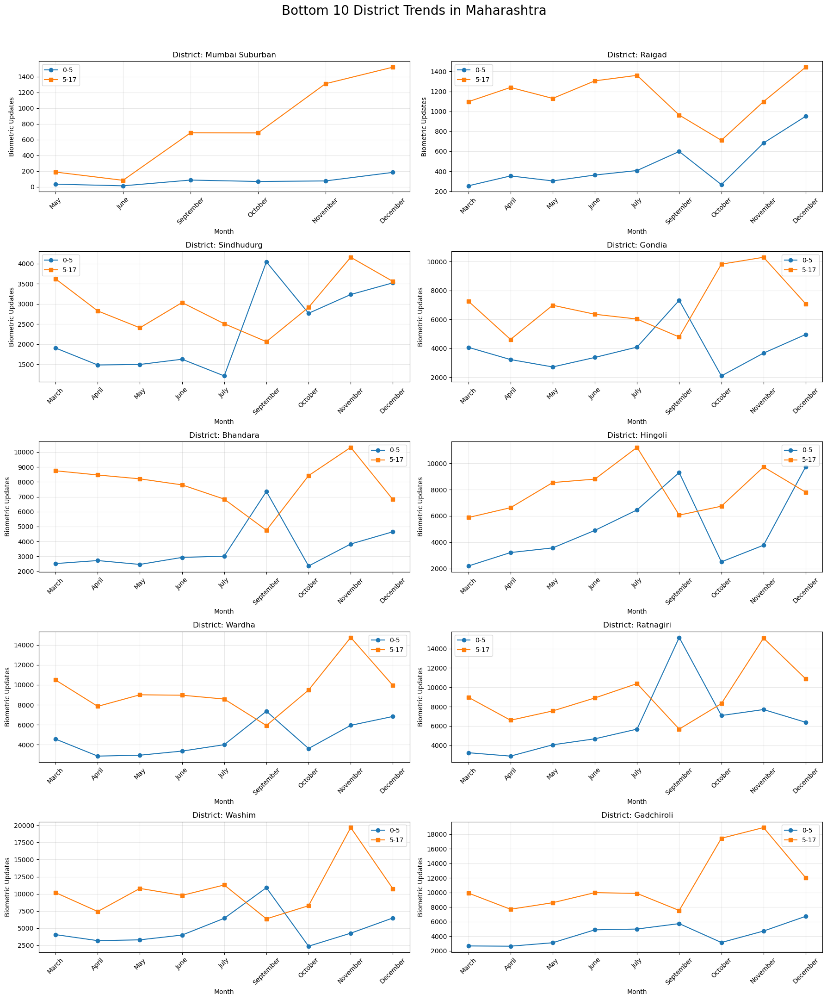

In [30]:
plot_state_district_bottom_trends('Maharashtra')

In [31]:
min_date = biom_df['date'].min()
max_date = biom_df['date'].max()
print(f"Minimum date: {min_date}")
print(f"Maximum date: {max_date}")

Minimum date: 2025-03-01
Maximum date: 2025-12-29


In [32]:
df = pd.read_csv('bio_df.csv')

In [33]:
df.columns

Index(['date', 'state', 'district', 'pincode', 'bio_age_5_17', 'bio_age_17_',
       'month', 'month_name'],
      dtype='object')

In [34]:
df["date"] = pd.to_datetime(df["date"], format="%Y-%m-%d")

# Extract day of week
df["day_of_week"] = df["date"].dt.day_name()

In [35]:
df.columns

Index(['date', 'state', 'district', 'pincode', 'bio_age_5_17', 'bio_age_17_',
       'month', 'month_name', 'day_of_week'],
      dtype='object')

In [36]:
df.head()

,date,state,district,pincode,bio_age_5_17,bio_age_17_,month,month_name,day_of_week
0,2025-03-01,Haryana,Mahendragarh,123029,280,577,3,March,Saturday
1,2025-03-01,Bihar,Madhepura,852121,144,369,3,March,Saturday
2,2025-03-01,Jammu And Kashmir,Punch,185101,643,1091,3,March,Saturday
3,2025-03-01,Bihar,Bhojpur,802158,256,980,3,March,Saturday
4,2025-03-01,Tamil Nadu,Madurai,625514,271,815,3,March,Saturday


In [37]:
df["day_type"] = df["date"].dt.weekday.apply(
    lambda x: "Weekend" if x >= 5 else "Weekday"
)


In [38]:
df.head()

,date,state,district,pincode,bio_age_5_17,bio_age_17_,month,month_name,day_of_week,day_type
0,2025-03-01,Haryana,Mahendragarh,123029,280,577,3,March,Saturday,Weekend
1,2025-03-01,Bihar,Madhepura,852121,144,369,3,March,Saturday,Weekend
2,2025-03-01,Jammu And Kashmir,Punch,185101,643,1091,3,March,Saturday,Weekend
3,2025-03-01,Bihar,Bhojpur,802158,256,980,3,March,Saturday,Weekend
4,2025-03-01,Tamil Nadu,Madurai,625514,271,815,3,March,Saturday,Weekend


In [39]:
df[df["day_of_week"] == "Tuesday"]

,date,state,district,pincode,bio_age_5_17,bio_age_17_,month,month_name,day_of_week,day_type
21953,2025-04-01,Gujarat,Valsad,396051,331,407,4,April,Tuesday,Weekday
21954,2025-04-01,Maharashtra,Palghar,401404,330,272,4,April,Tuesday,Weekday
21955,2025-04-01,Rajasthan,Jaipur,302019,220,463,4,April,Tuesday,Weekday
21956,2025-04-01,Madhya Pradesh,Betul,460440,804,919,4,April,Tuesday,Weekday
21957,2025-04-01,Himachal Pradesh,Kangra,176021,51,75,4,April,Tuesday,Weekday
...,...,...,...,...,...,...,...,...,...,...
1746945,2025-12-23,Uttar Pradesh,Kushinagar,274408,1,0,12,December,Tuesday,Weekday
1746946,2025-12-23,Uttar Pradesh,Maharajganj,273302,0,1,12,December,Tuesday,Weekday
1746947,2025-12-23,Uttar Pradesh,Pilibhit,262001,0,2,12,December,Tuesday,Weekday
1746948,2025-12-23,West Bengal,Malda,732208,0,1,12,December,Tuesday,Weekday


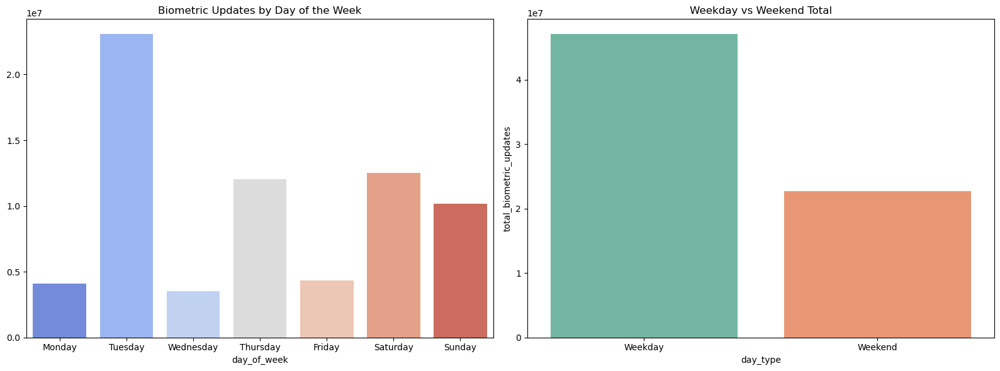

In [40]:
df['total_biometric_updates'] = df['bio_age_5_17'] + df['bio_age_17_']

# Grouping for Day of the Week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekly_data = df.groupby('day_of_week')['total_biometric_updates'].sum().reindex(day_order)

# Plotting
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Weekly Distribution
sns.barplot(x=weekly_data.index, y=weekly_data.values, ax=axes[0], palette='coolwarm')
axes[0].set_title('Biometric Updates by Day of the Week')

# Plot 2: Weekday vs Weekend
sns.barplot(data=df.groupby('day_type')['total_biometric_updates'].sum().reset_index(), 
            x='day_type', y='total_biometric_updates', ax=axes[1], palette='Set2')
axes[1].set_title('Weekday vs Weekend Total')

plt.tight_layout()
plt.show()

In [41]:
# Group by month_name and get unique day names for each month
days_names_per_month = df.groupby('month_name')['day_of_week'].apply(lambda x: sorted(x.unique())).reset_index()
print(days_names_per_month)

  month_name                                        day_of_week
0      April                                          [Tuesday]
1   December  [Friday, Monday, Saturday, Sunday, Thursday, T...
2       July                                          [Tuesday]
3       June                                           [Sunday]
4      March                                         [Saturday]
5        May                                         [Thursday]
6   November  [Friday, Monday, Saturday, Sunday, Thursday, T...
7    October  [Friday, Monday, Saturday, Sunday, Thursday, T...
8  September  [Friday, Monday, Saturday, Sunday, Thursday, T...


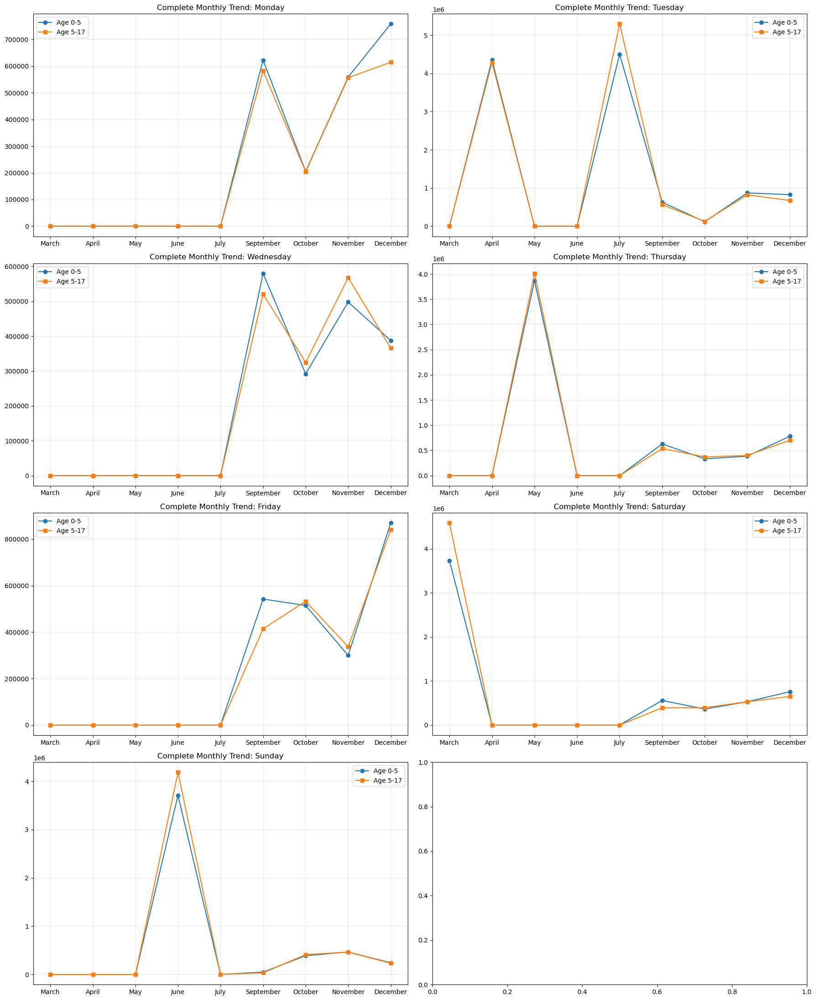

In [42]:
df['date'] = pd.to_datetime(df['date'])
df['day_of_week'] = df['date'].dt.day_name()

# Get all unique months in order
month_info = df[['month', 'month_name']].drop_duplicates().sort_values('month')
all_months = month_info['month_name'].tolist()
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Aggregate
daily_monthly_age = df.groupby(['day_of_week', 'month_name'])[["bio_age_5_17", "bio_age_17_"]].sum().reset_index()

# Plotting 7 charts (one for each day)
fig, axes = plt.subplots(4, 2, figsize=(18, 22))
axes = axes.flatten()

for i, day in enumerate(day_order):
    ax = axes[i]
    # Filter and reindex to include ALL months (filling missing with 0)
    day_data = daily_monthly_age[daily_monthly_age['day_of_week'] == day]
    day_data_full = day_data.set_index('month_name').reindex(all_months).fillna(0).reset_index()
    
    # Plot lines
    ax.plot(day_data_full['month_name'], day_data_full['bio_age_5_17'], marker='o', label='Age 0-5')
    ax.plot(day_data_full['month_name'], day_data_full['bio_age_17_'], marker='s', label='Age 5-17')

    ax.set_title(f'Complete Monthly Trend: {day}')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

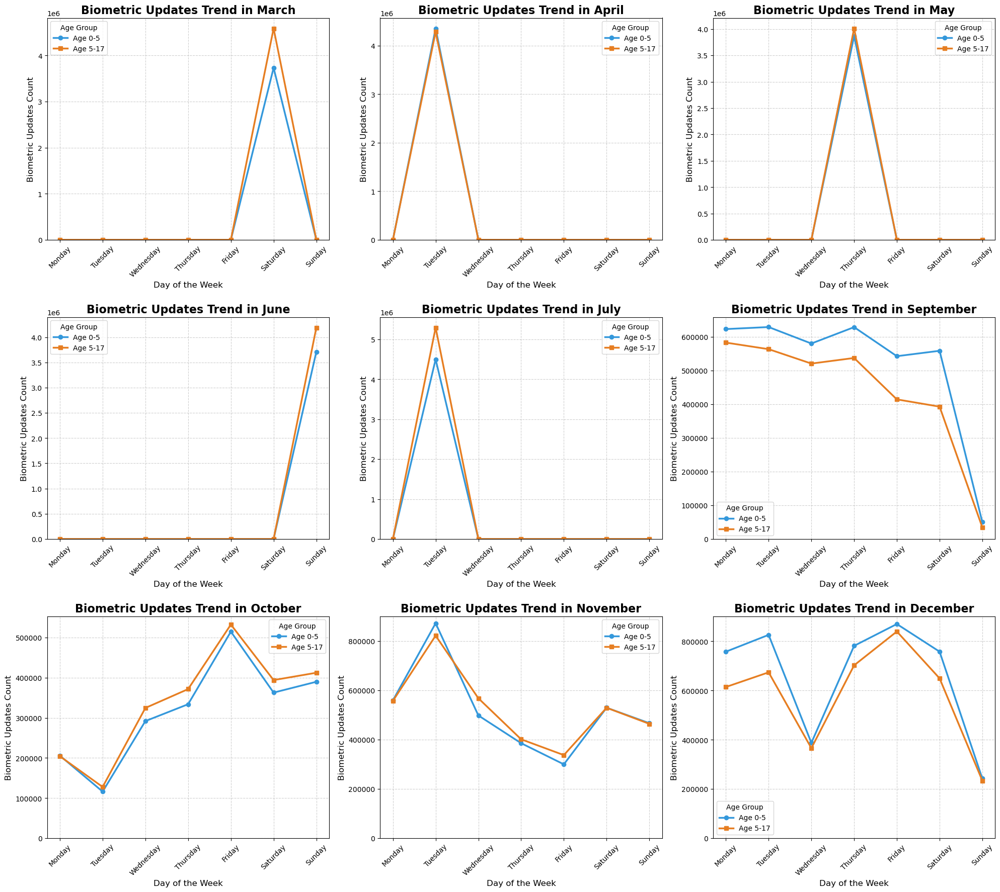

Analysis Complete. 9 month charts generated.


In [43]:
df['date'] = pd.to_datetime(df['date'])
df['day_of_week'] = df['date'].dt.day_name()

# 2. Define chronological orders
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
# Get unique month names in the correct chronological order using the numeric 'month' column
month_info = df[['month', 'month_name']].drop_duplicates().sort_values('month')
all_months = month_info['month_name'].unique().tolist()

# 3. Aggregate the data by Month (numeric), Month Name, and Day of Week
monthly_daily_age = df.groupby(['month', 'month_name', 'day_of_week'])[["bio_age_5_17", "bio_age_17_"]].sum().reset_index()

# 4. Create subplots for each month
num_months = len(all_months)
cols = 3
rows = math.ceil(num_months / cols)

fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 6))
axes = axes.flatten()

for i, month_name in enumerate(all_months):
    ax = axes[i]
    
    # Filter for the specific month name
    month_data = monthly_daily_age[monthly_daily_age['month_name'] == month_name]
    
    # FIXED STEP: Ensure day_of_week labels are unique before reindexing
    # We group by day_of_week and sum again to aggregate any duplicate month names
    month_data_grouped = month_data.groupby('day_of_week')[["bio_age_5_17", "bio_age_17_"]].sum()
    
    # Reindex to ensure ALL 7 days of the week are present on the chart
    month_data_full = month_data_grouped.reindex(day_order).fillna(0).reset_index()
    
    # 5. Plotting
    ax.plot(month_data_full['day_of_week'], month_data_full['bio_age_5_17'], marker='o', label='Age 0-5', linewidth=2.5, color='#3498db')
    ax.plot(month_data_full['day_of_week'], month_data_full['bio_age_17_'], marker='s', label='Age 5-17', linewidth=2.5, color='#e67e22')

    ax.set_title(f'Biometric Updates Trend in {month_name}', fontsize=16, fontweight='bold')
    ax.set_xlabel('Day of the Week', fontsize=12)
    ax.set_ylabel('Biometric Updates Count', fontsize=12)
    ax.legend(title='Age Group')
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.set_ylim(bottom=0)
    ax.tick_params(axis='x', rotation=45)

# Remove any extra empty subplots
for k in range(num_months, len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.savefig('monthly_daywise_trends_fixed.png')
plt.show()

print(f"Analysis Complete. {num_months} month charts generated.")

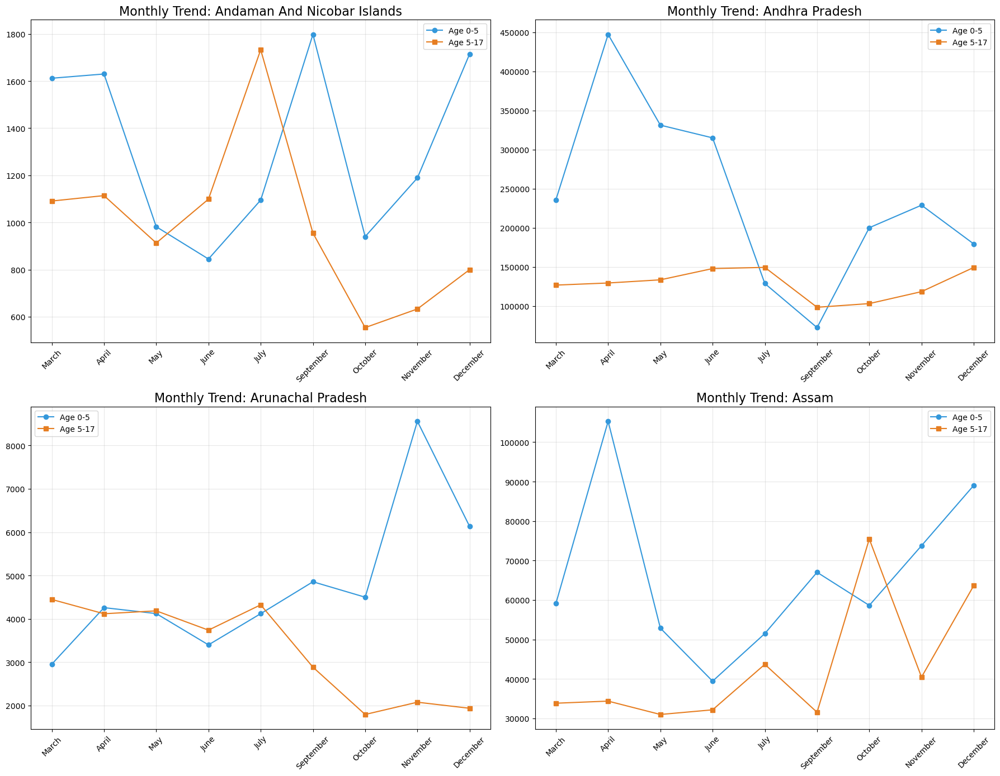

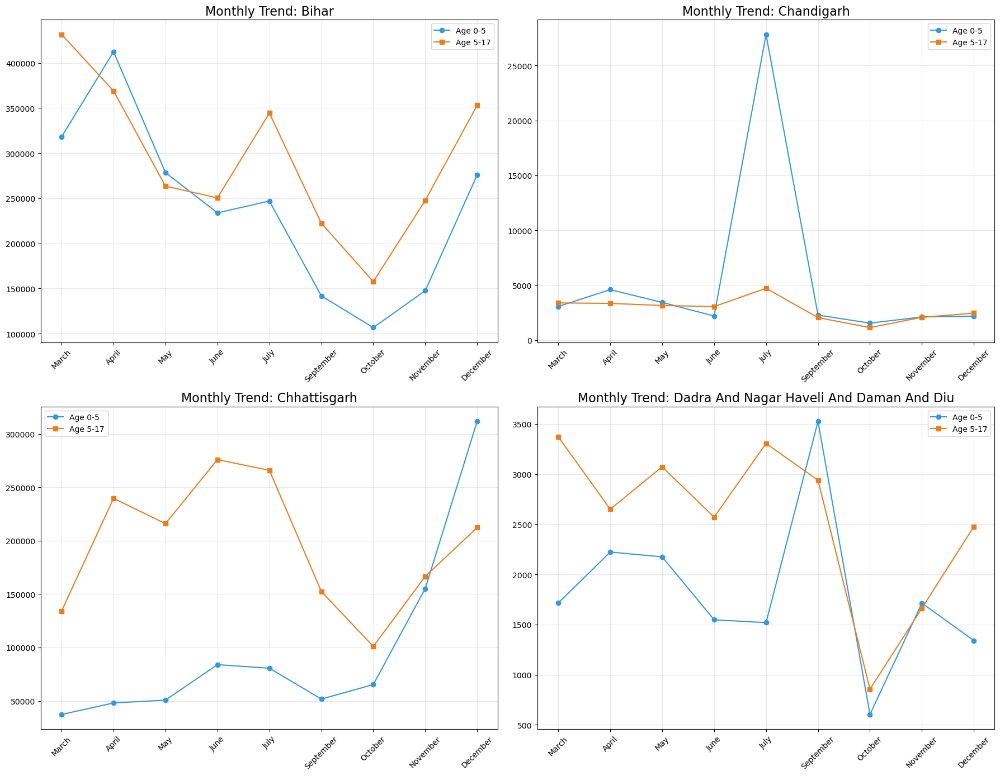

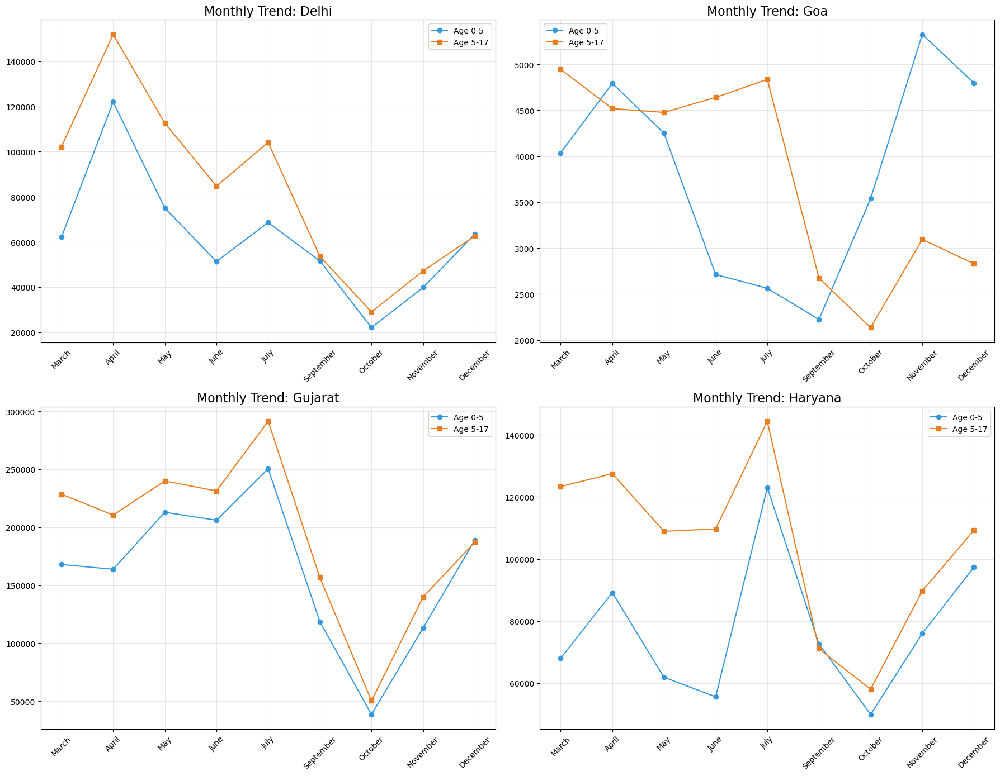

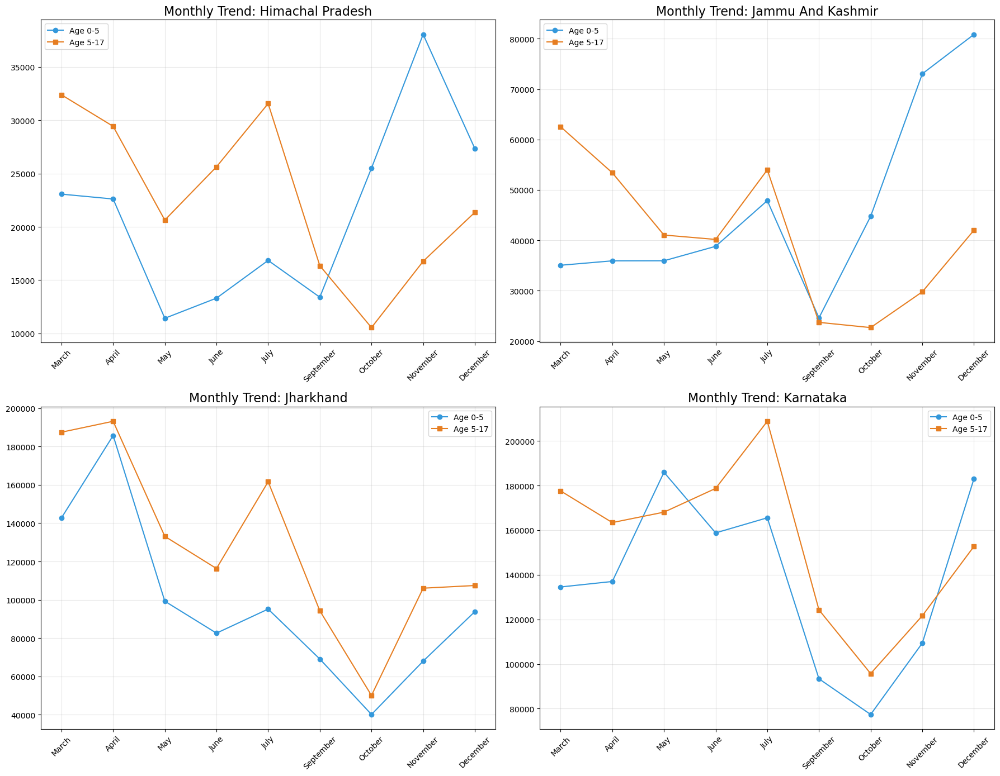

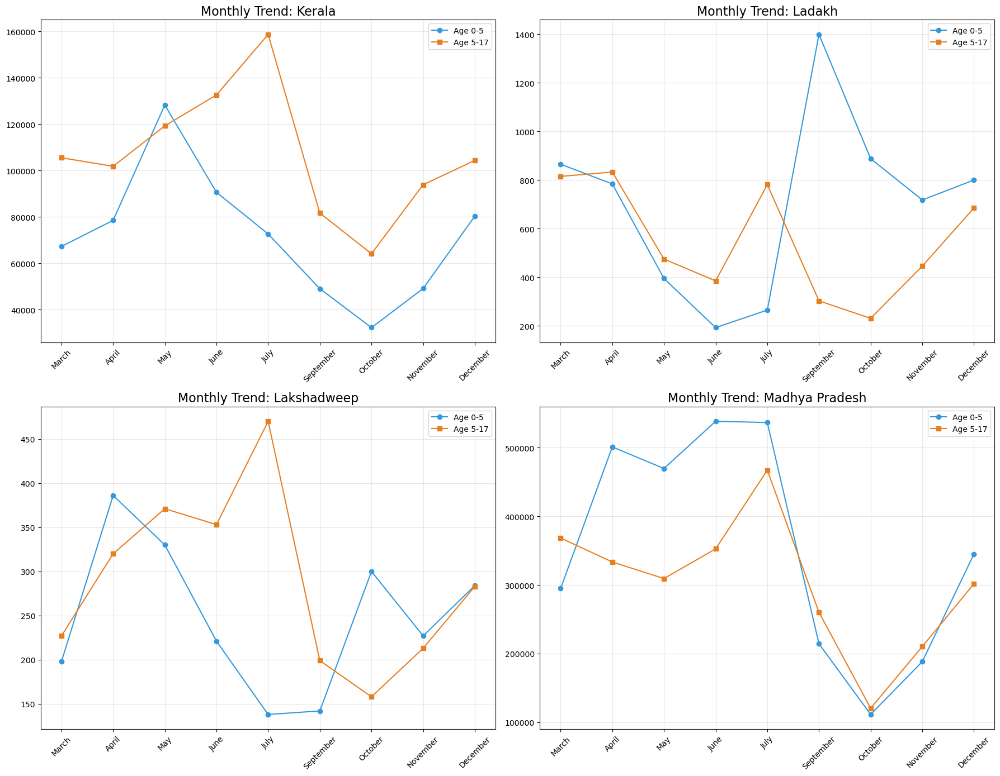

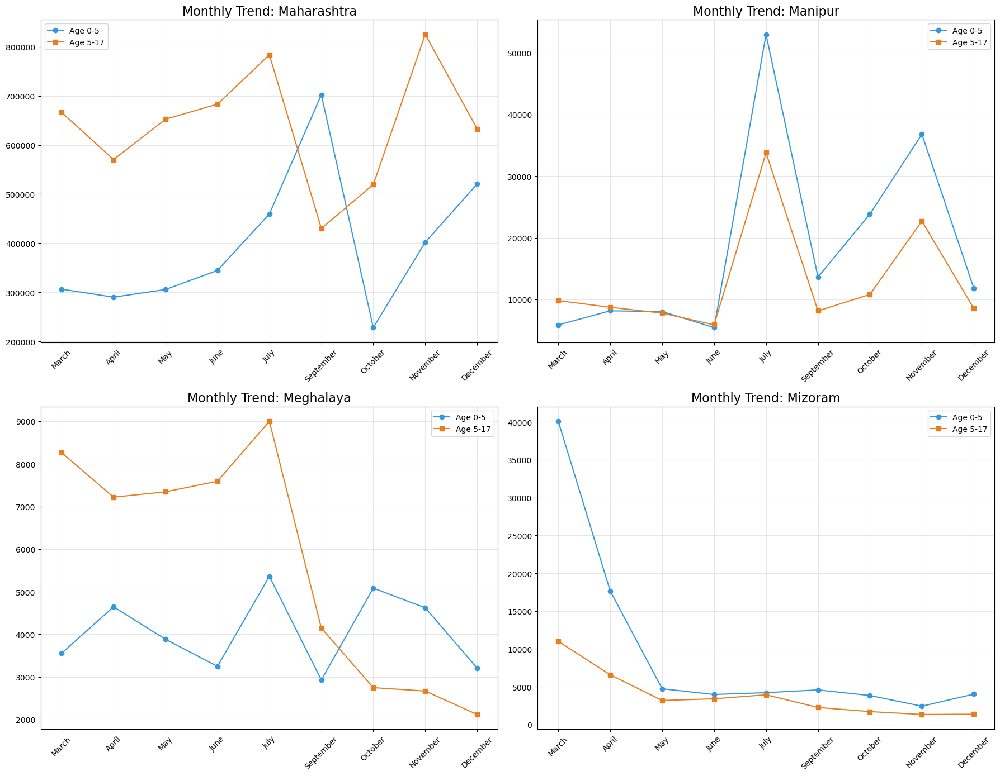

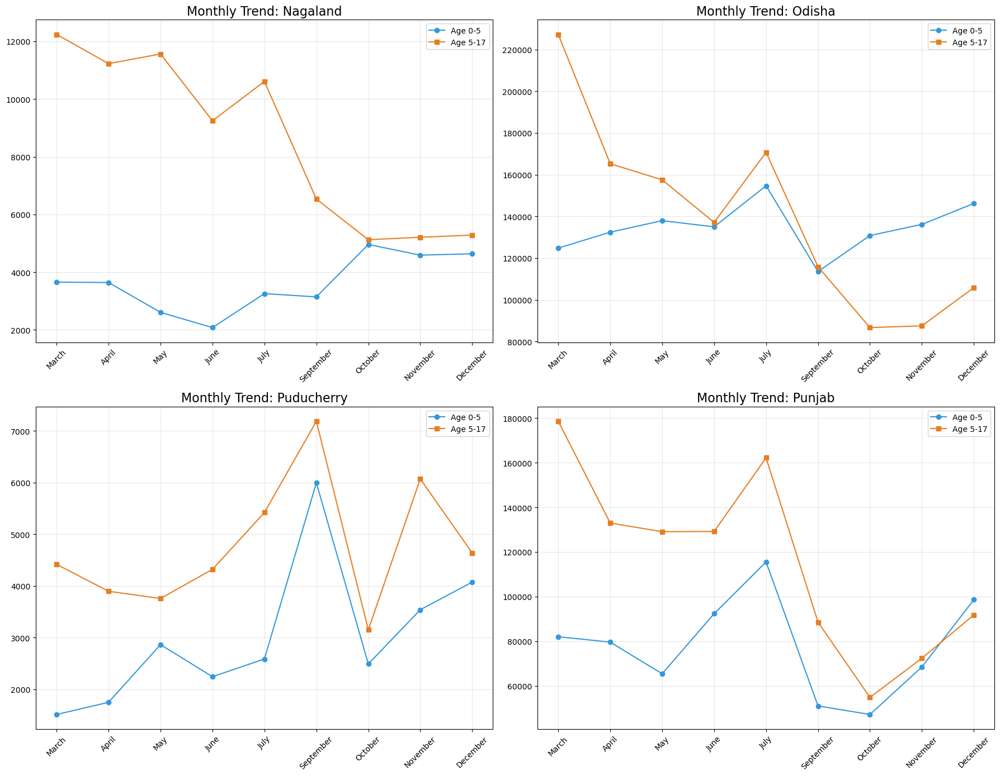

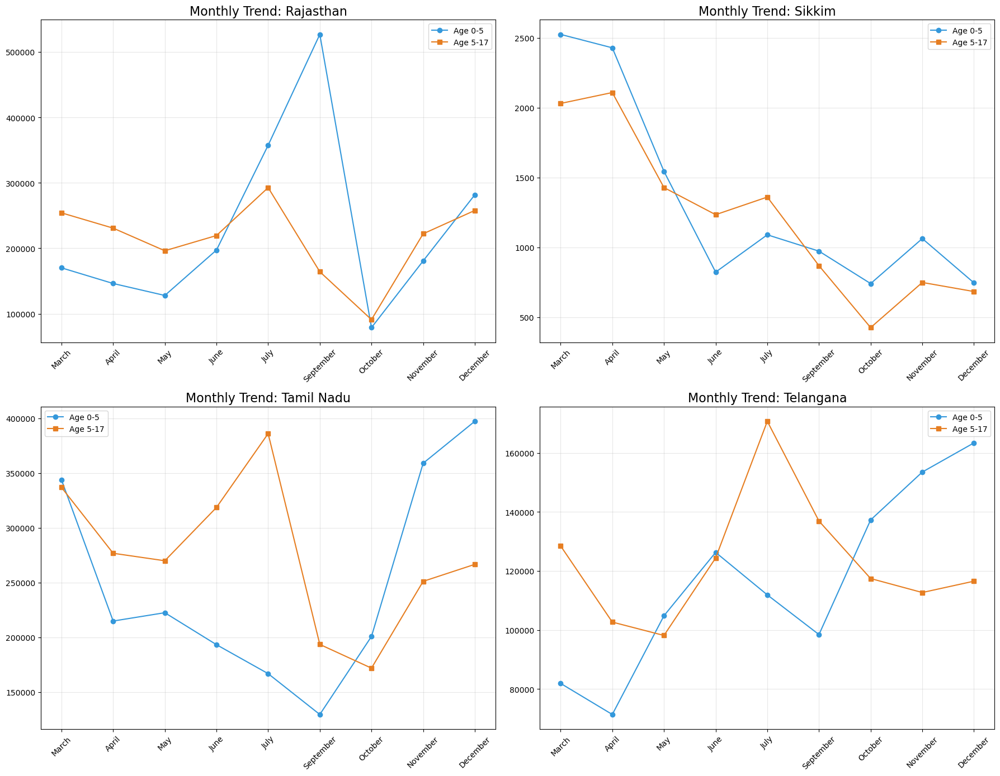

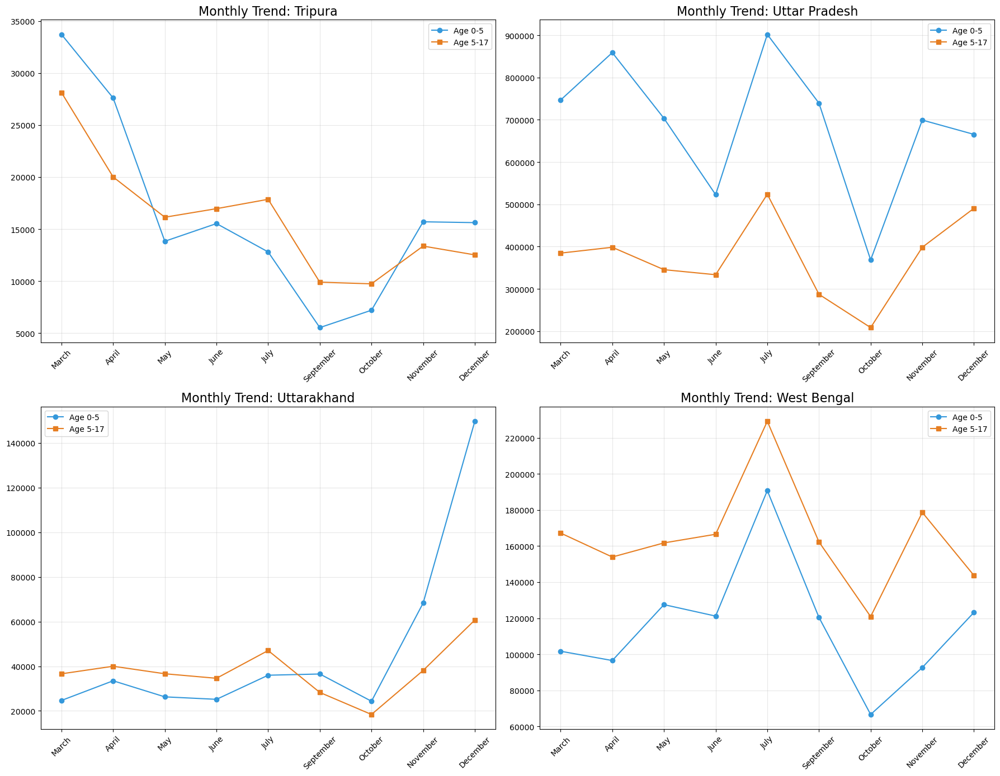

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import math

# 2. Pre-processing: Chronological month order
month_info = df[['month', 'month_name']].drop_duplicates().sort_values('month')
all_months = month_info['month_name'].tolist()

# 3. Aggregation
state_monthly = df.groupby(['state', 'month', 'month_name'])[["bio_age_5_17", "bio_age_17_"]].sum().reset_index()
states = sorted(state_monthly['state'].unique())

# 4. Plotting in Batches (4 states per image)
num_states = len(states)
num_figs = math.ceil(num_states / 4)

for i in range(num_figs):
    current_batch = states[i*4 : (i+1)*4]
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    axes = axes.flatten()
    
    for j, state in enumerate(current_batch):
        # Filter for the state and ensure ALL months are present
        data = state_monthly[state_monthly['state'] == state]
        data_full = data.set_index('month_name').reindex(all_months).fillna(0).reset_index()
        
        ax = axes[j]
        ax.plot(data_full['month_name'], data_full['bio_age_5_17'], marker='o', label='Age 0-5', color='#3498db')
        ax.plot(data_full['month_name'], data_full['bio_age_17_'], marker='s', label='Age 5-17', color='#e67e22')

        ax.set_title(f'Monthly Trend: {state}', fontsize=16)
        ax.legend()
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis='x', rotation=45)

    # Clean up empty subplots
    for k in range(len(current_batch), 4): fig.delaxes(axes[k])
    
    plt.tight_layout()
    plt.savefig(f'state_monthly_age_trend_batch_{i+1}.png')
    plt.show()

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import math

# 2. Setup orderings
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
all_months = df.sort_values('month')['month_name'].unique().tolist()

def plot_state_monthly_day_trends(state_name):
    # Filter and aggregate
    state_df = df[df['state'] == state_name]
    monthly_daily = state_df.groupby(['month', 'month_name', 'day_of_week'])[["bio_age_5_17", "bio_age_17_"]].sum().reset_index()
    
    # Grid setup (3x3 for 9 months)
    rows, cols = 3, 3
    fig, axes = plt.subplots(rows, cols, figsize=(18, 15))
    axes = axes.flatten()
    
    for i, month in enumerate(all_months):
        ax = axes[i]
        # Aggregate and reindex for 7 days
        m_data = monthly_daily[monthly_daily['month_name'] == month].groupby('day_of_week').sum()
        m_data_full = m_data.reindex(day_order).fillna(0).reset_index()
        
        # Plotting
        ax.plot(m_data_full['day_of_week'], m_data_full['bio_age_5_17'], marker='o', label='0-5')
        ax.plot(m_data_full['day_of_week'], m_data_full['bio_age_17_'], marker='s', label='5-17')

        ax.set_title(month, fontweight='bold')
        ax.tick_params(axis='x', rotation=45)
        ax.grid(True, alpha=0.3)
        if i == 0: ax.legend()

    fig.suptitle(f'Monthly Day-wise Trends: {state_name}', fontsize=20)
    plt.tight_layout()
    plt.show()


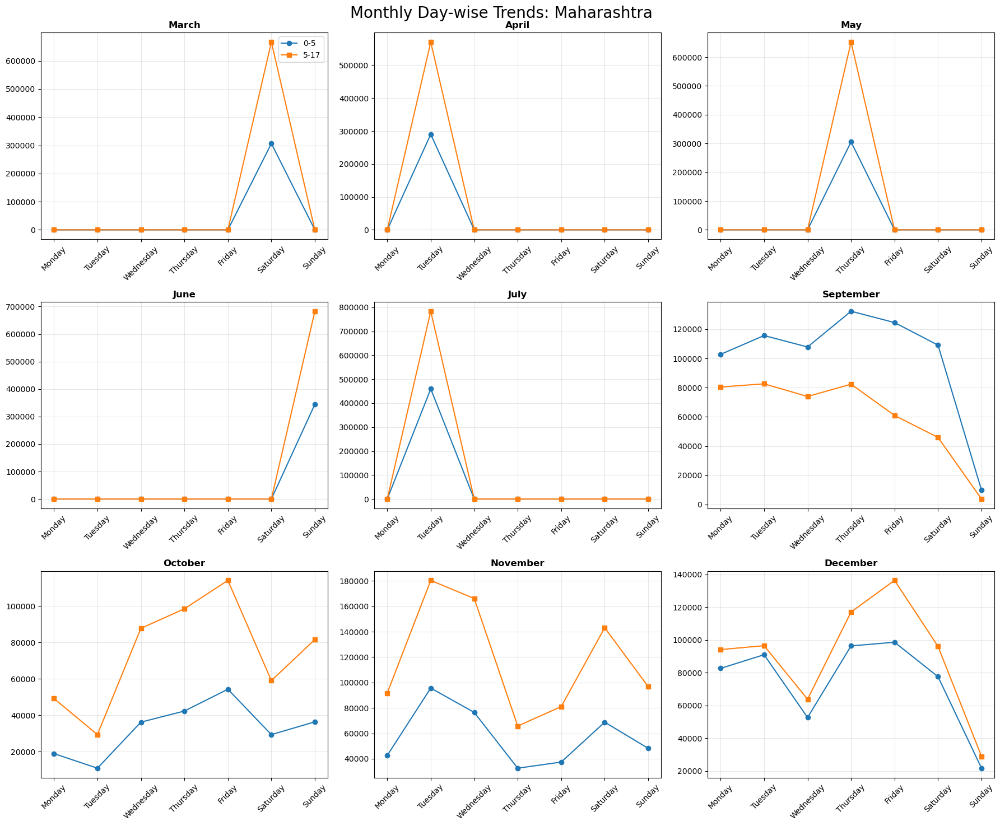

In [46]:
plot_state_monthly_day_trends('Maharashtra')

In [47]:
month_order = ["March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Convert to ordered categorical for proper sorting
df["month_name"] = pd.Categorical(df["month_name"], categories=month_order, ordered=True)
df["day_of_week"] = pd.Categorical(df["day_of_week"], categories=day_order, ordered=True)

def plot_state_district_day_trends(state_name):
    # 3. Total biometric updates for ranking
    df["total_biometric_updates"] = df["bio_age_5_17"] + df["bio_age_17_"]

    # 4. Select top 10 districts for the given state
    district_agg = df[df["state"] == state_name].groupby("district")["total_biometric_updates"].sum().reset_index()
    top_districts = district_agg.nlargest(10, "total_biometric_updates")["district"].values
    
    # 5. Filter and Aggregate by District, Month, AND Day of Week
    df_filtered = df[(df["state"] == state_name) & (df["district"].isin(top_districts))].copy()
    
    agg = df_filtered.groupby(["district", "month_name", "day_of_week"], observed=True)[
        ["bio_age_17_", "bio_age_5_17"]
    ].sum().reset_index()

    # Sort to ensure continuous timeline (Chronological)
    agg = agg.sort_values(["district", "month_name", "day_of_week"])

    # Create descriptive X-axis labels (e.g., Sep-Mon)
    agg["label"] = agg["month_name"].astype(str).str[:3] + "-" + agg["day_of_week"].astype(str).str[:3]

    # 6. Plotting - Using 10 rows to give the detailed timeline more room
    fig, axes = plt.subplots(10, 1, figsize=(20, 45))
    fig.suptitle(f"Individual Day-wise Trends for Top 10 Districts in {state_name}", fontsize=24, y=1.0)
    
    for i, dist in enumerate(top_districts):
        data = agg[agg["district"] == dist]
        ax = axes[i]

        ax.plot(data["label"], data["bio_age_5_17"], marker="o", label="0-5", linewidth=1.5)
        ax.plot(data["label"], data["bio_age_17_"], marker="s", label="5-17", linewidth=1.5)

        ax.set_title(f"District: {dist}", fontsize=18, fontweight='bold')
        ax.set_ylabel("Biometric Updates Count")
        ax.legend()
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis='x', rotation=90) # Rotate for readability

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


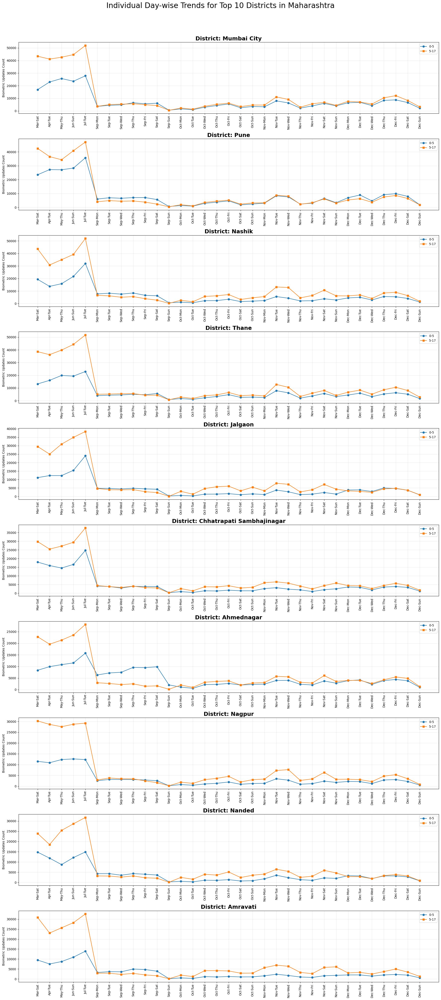

In [48]:
plot_state_district_day_trends("Maharashtra")

In [57]:
# Define Chronological Orders
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
month_order = ["January", "February", "March", "April", "May", "June", 
               "July", "August", "September", "October", "November", "December"]

# Convert to ordered categorical for proper plotting
df["month_name"] = pd.Categorical(df["month_name"], categories=month_order, ordered=True)
df["day_of_week"] = pd.Categorical(df["day_of_week"], categories=day_order, ordered=True)

def generate_district_monthly_day_plots(state_name):
    # Filter for the state and find top 10 districts
    state_df = df[df['state'] == state_name]
    district_agg = state_df.groupby('district')['total_biometric_updates'].sum().reset_index()
    top_10_districts = district_agg.nlargest(10, 'total_biometric_updates')['district'].tolist()
    
    # Process each district individually
    for dist in top_10_districts:
        dist_df = state_df[state_df['district'] == dist]
        
        # Create a 4x3 grid for the 12 months
        fig, axes = plt.subplots(4, 3, figsize=(20, 20))
        fig.suptitle(f'12-Month Day-wise Analysis: {dist} ({state_name})', fontsize=26, fontweight='bold', y=1.03)
        axes = axes.flatten()
        
        for i, month in enumerate(month_order):
            ax = axes[i]
            
            # Filter and aggregate for this month
            month_data = dist_df[dist_df['month_name'] == month]
            day_data = month_data.groupby('day_of_week', observed=True)[["bio_age_17_", "bio_age_5_17"]].sum()
            
            # Ensure all 7 days are represented on the axis
            day_data_full = day_data.reindex(day_order).fillna(0).reset_index()
            
            # Plot age groups
            ax.plot(day_data_full['day_of_week'], day_data_full['bio_age_17_'], marker='o', label='0-5', color='#3498db', linewidth=2)
            ax.plot(day_data_full['day_of_week'], day_data_full['bio_age_5_17'], marker='s', label='5-17', color='#e67e22', linewidth=2)
            
            ax.set_title(month, fontsize=16, fontweight='bold')
            ax.tick_params(axis='x', rotation=45)
            ax.grid(True, alpha=0.3)
            if i == 0: ax.legend()
        
        plt.tight_layout()
        plt.savefig(f'analysis_{dist.replace(" ", "_")}.png', bbox_inches='tight')
        plt.show()


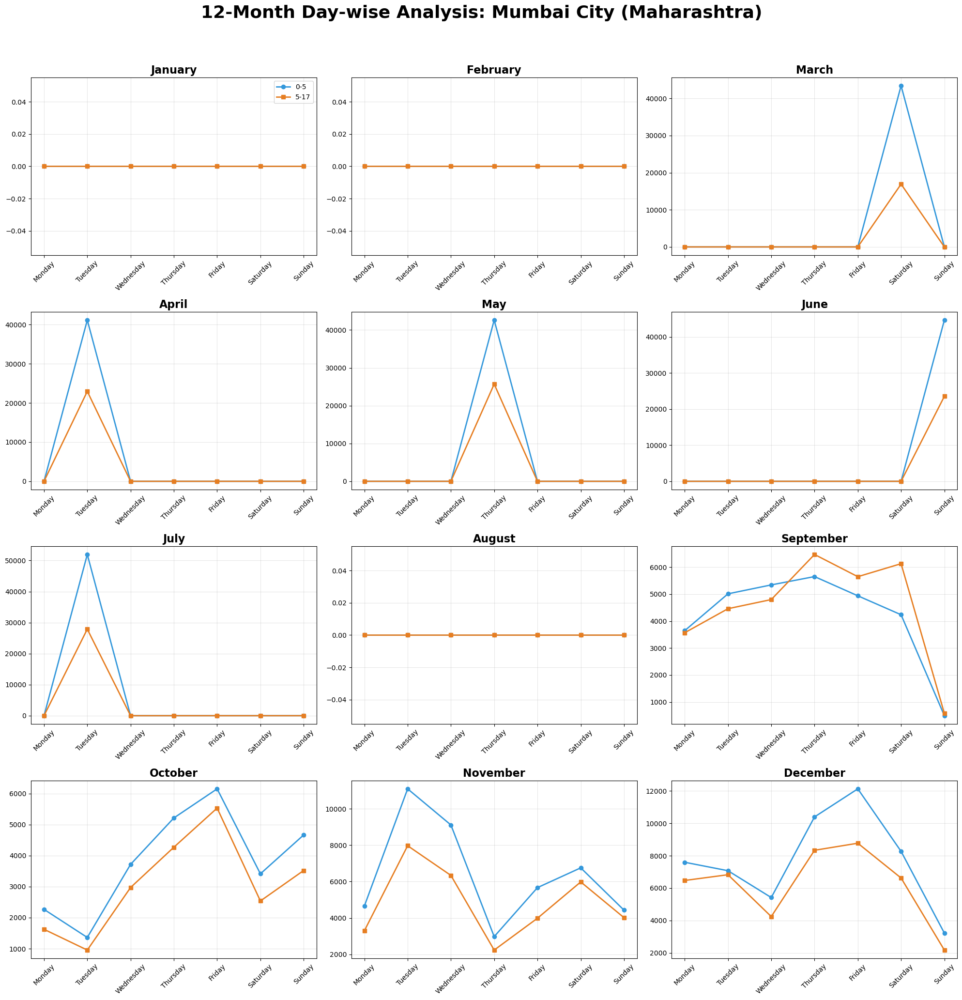

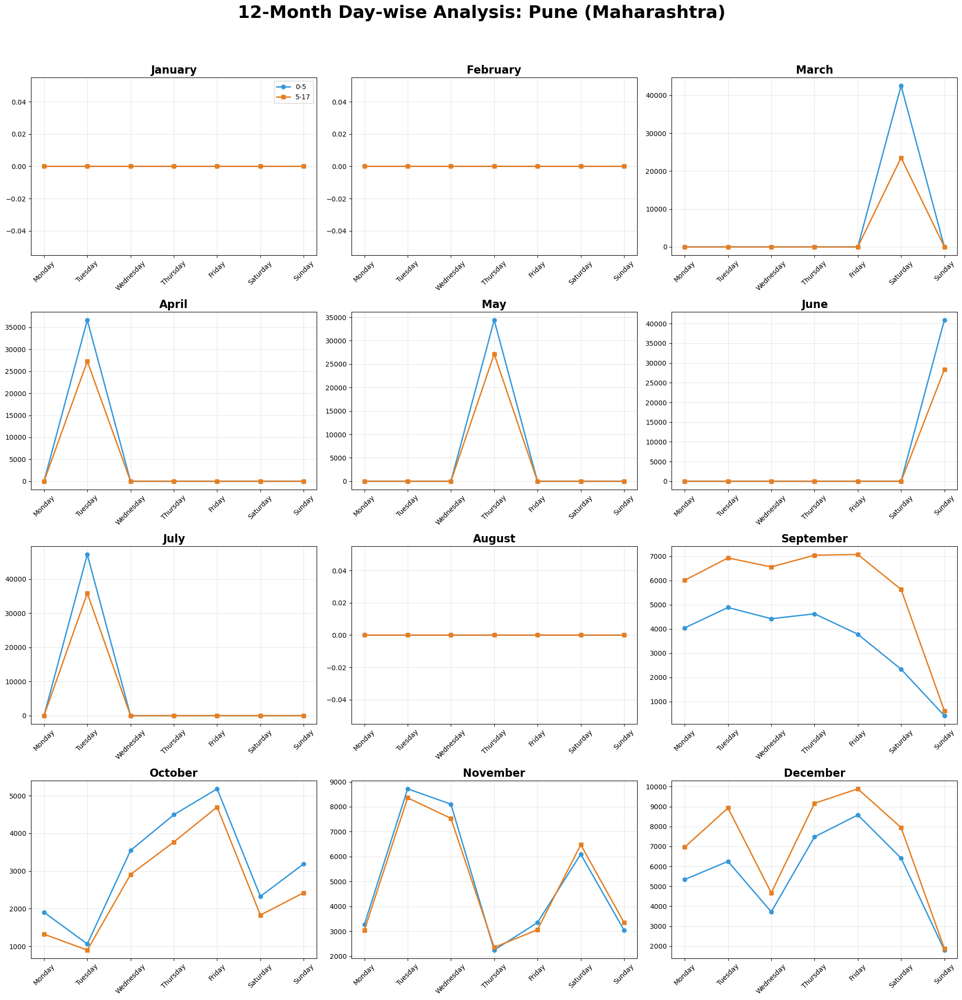

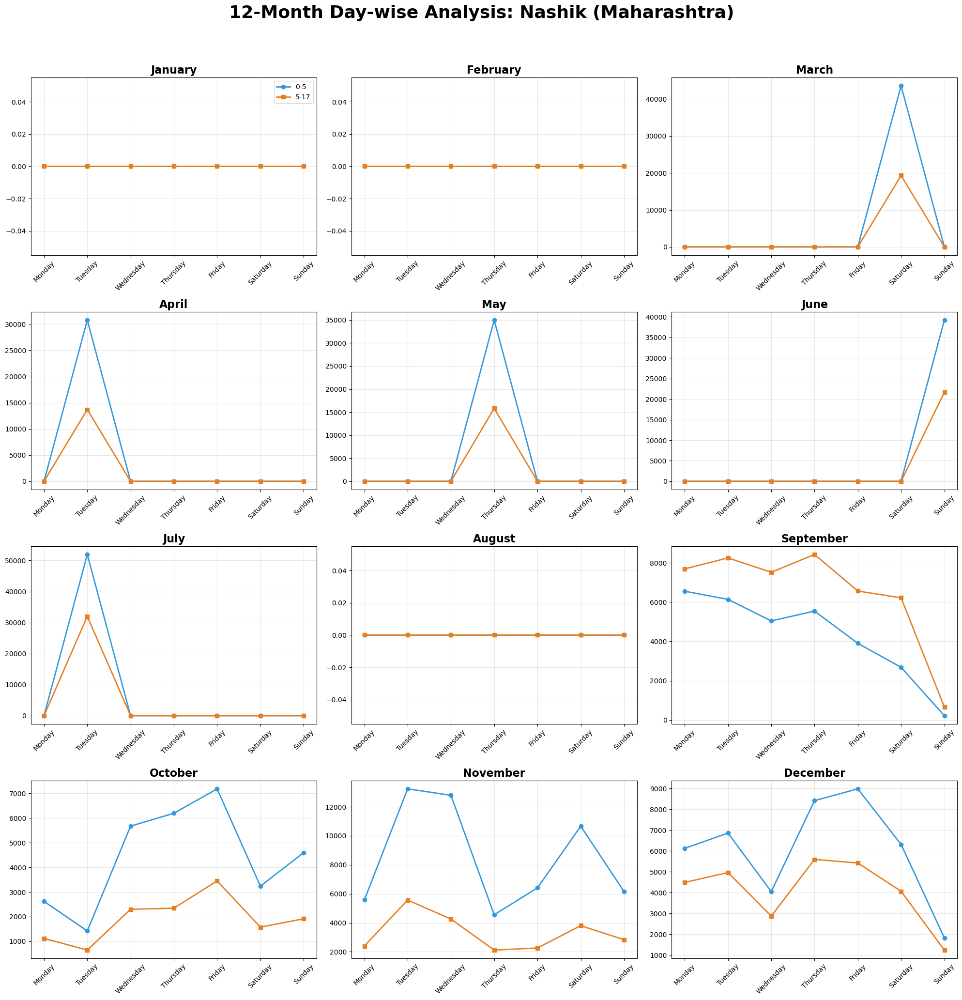

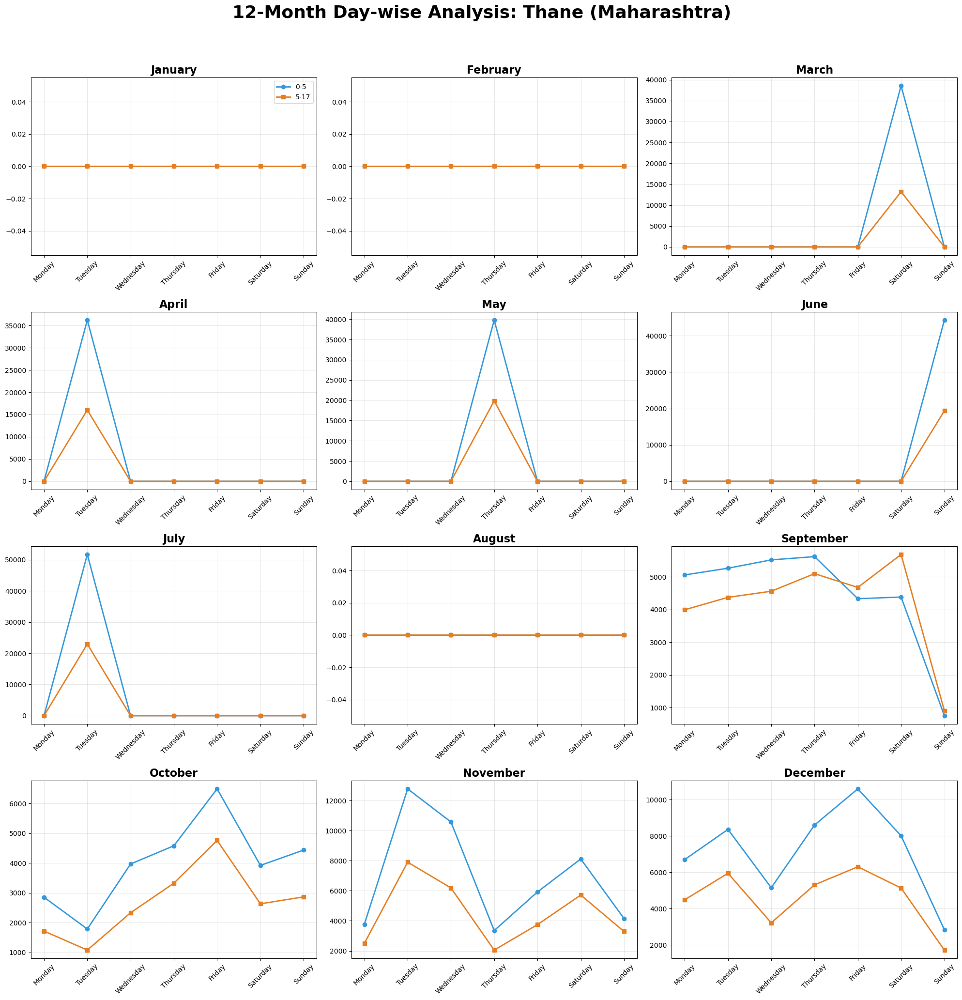

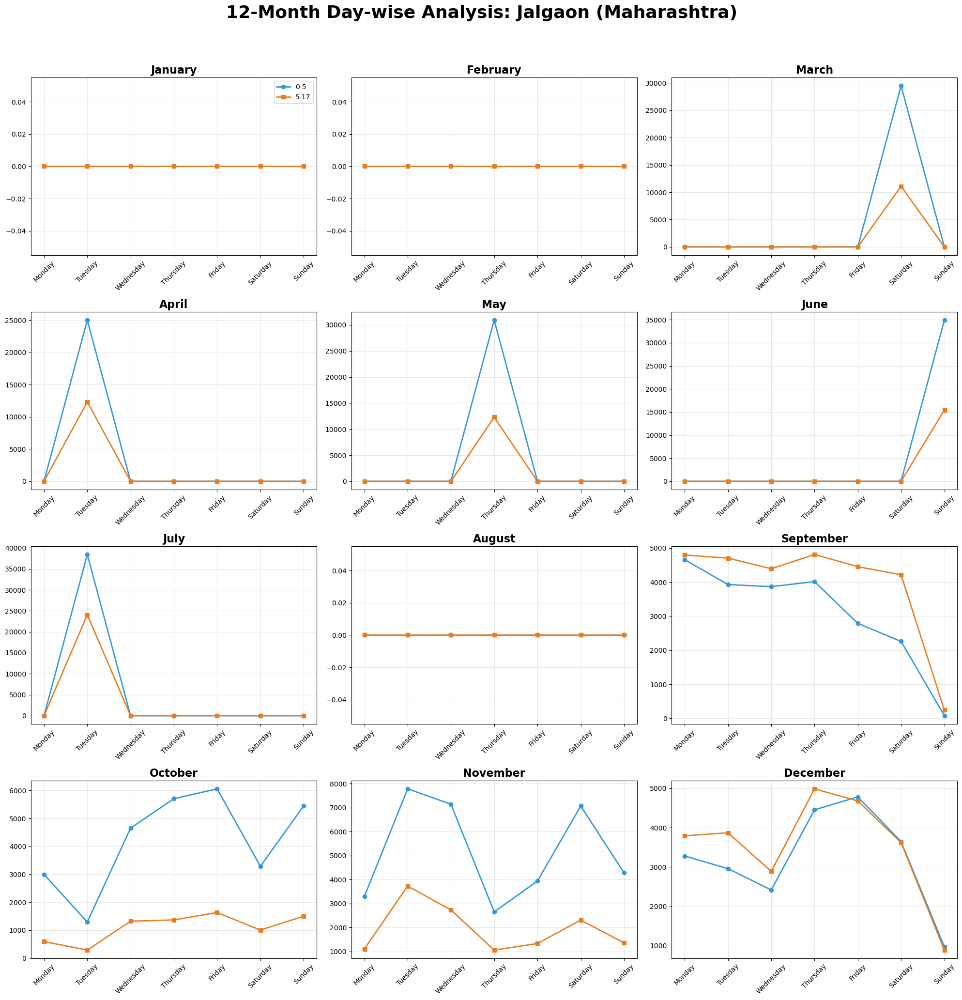

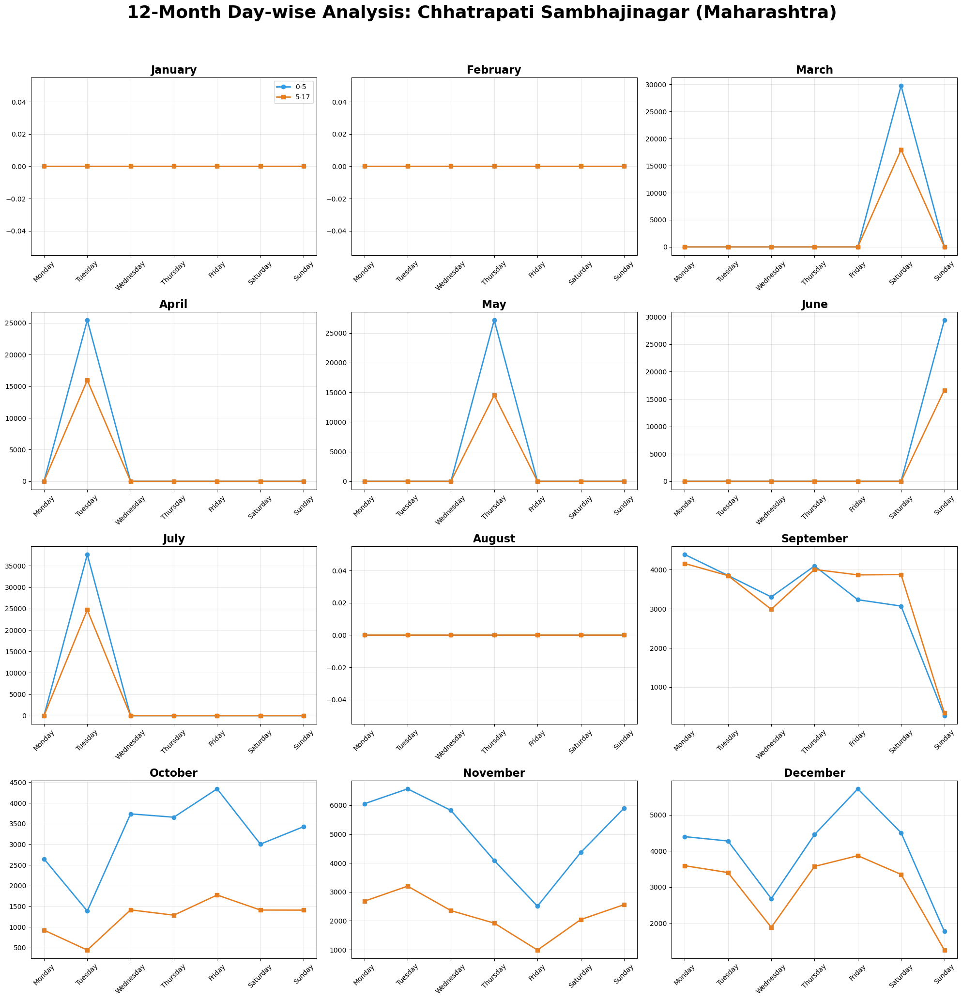

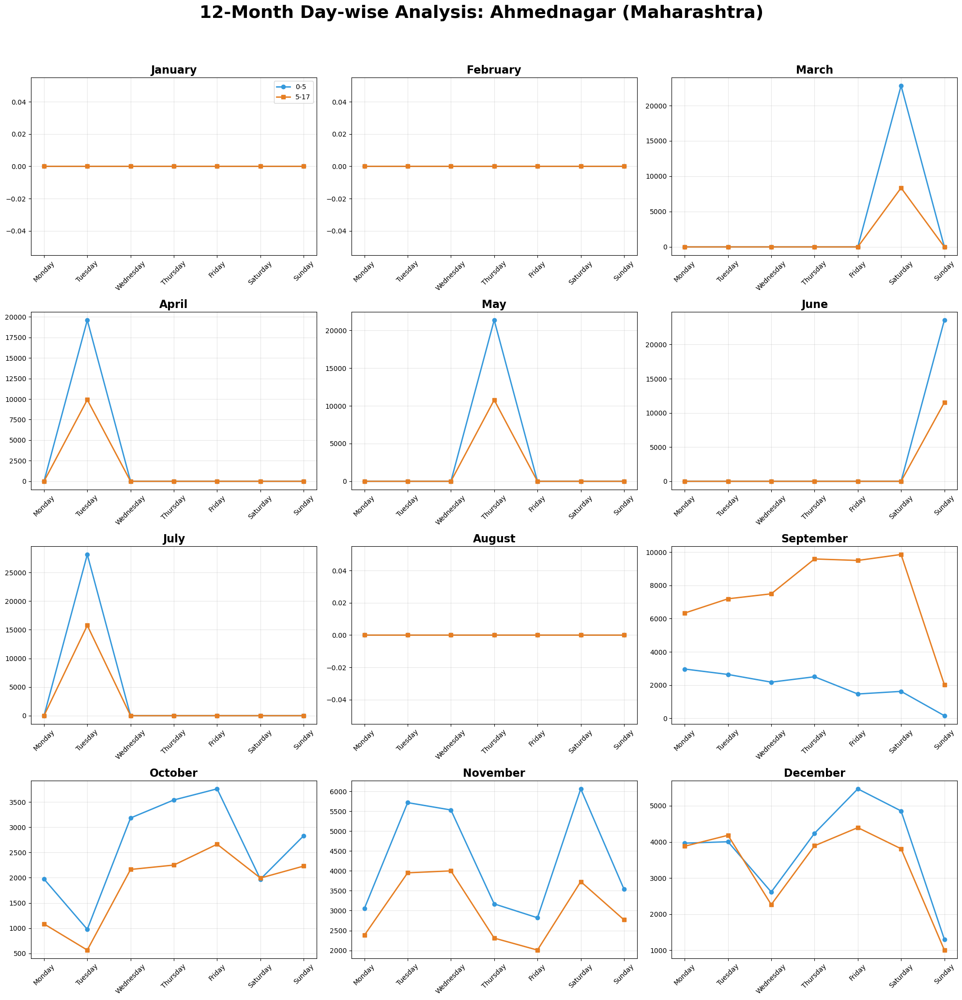

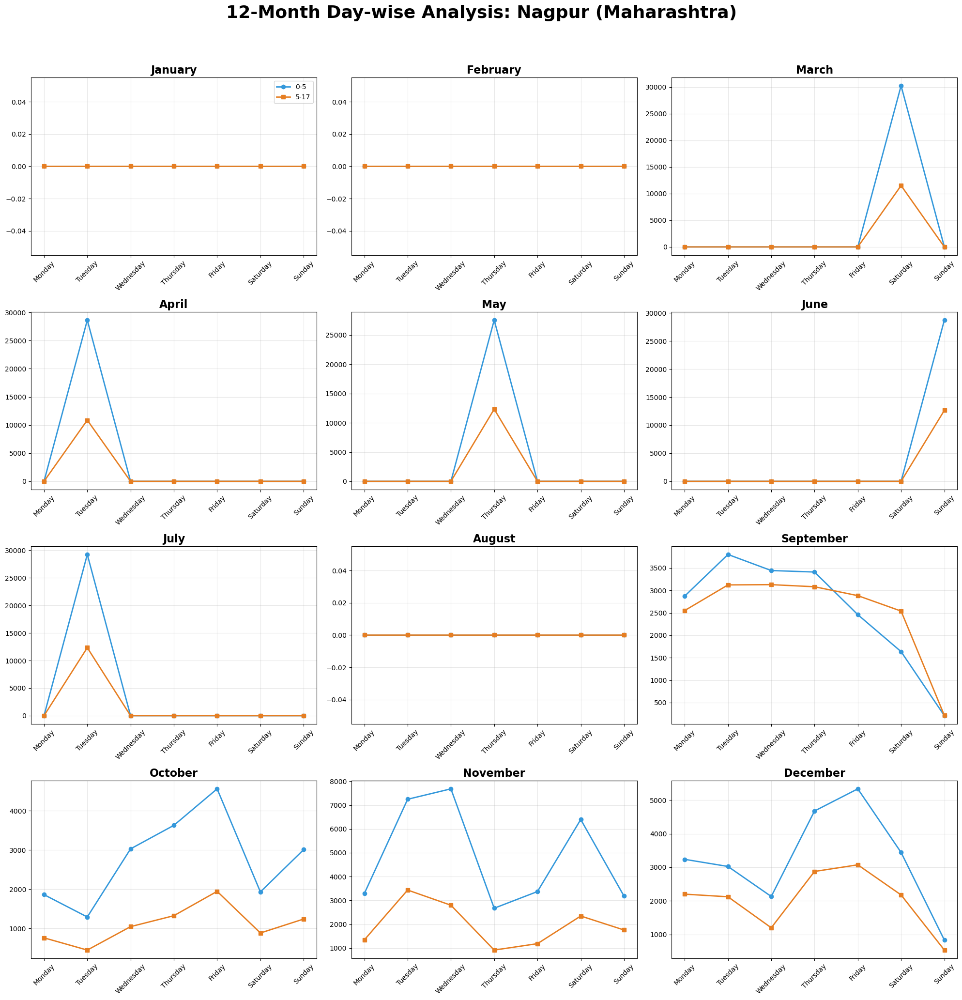

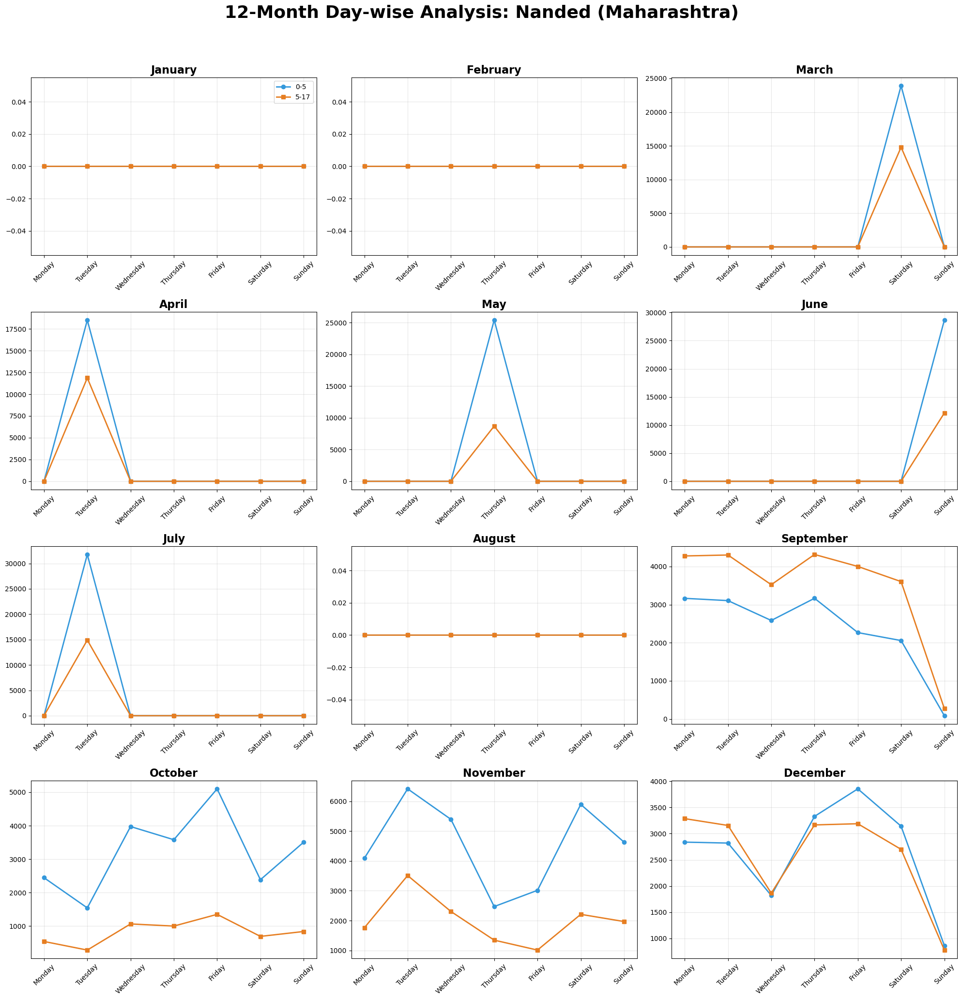

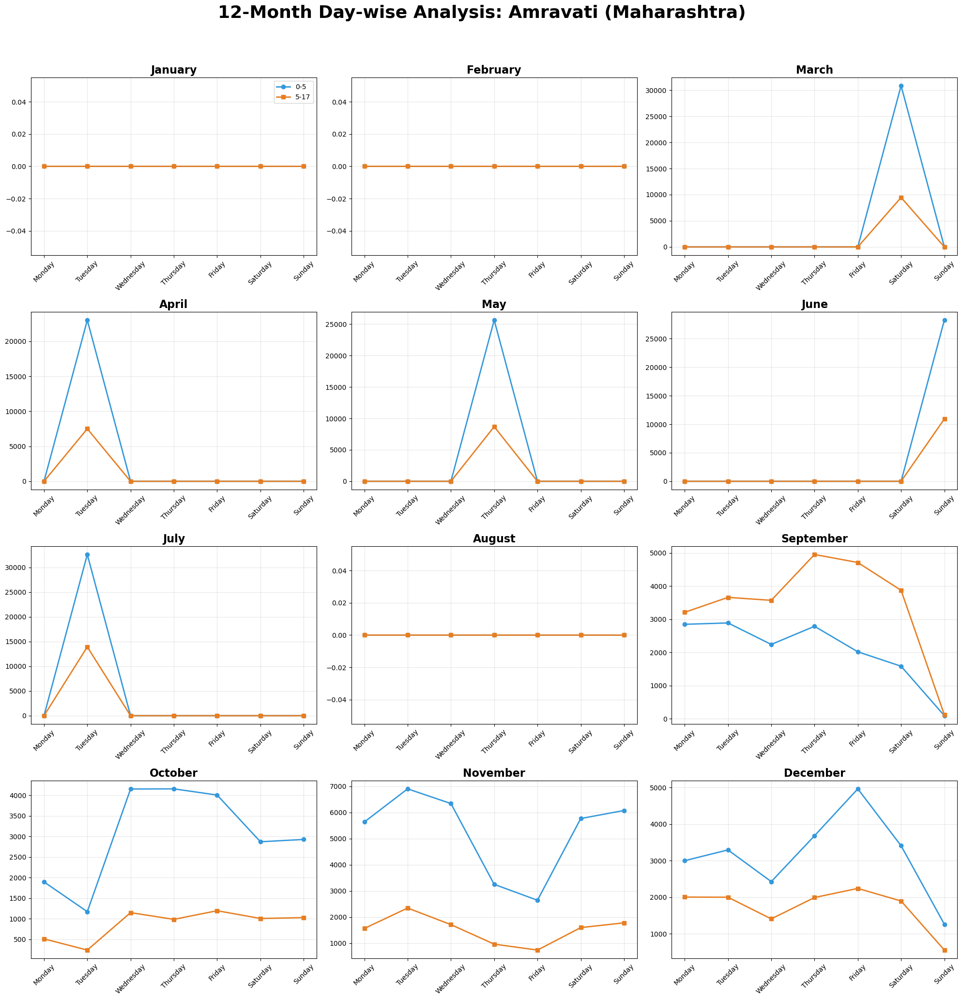

In [58]:
generate_district_monthly_day_plots("Maharashtra")

In [49]:
month_order = ["March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Convert to ordered categorical for proper sorting
df["month_name"] = pd.Categorical(df["month_name"], categories=month_order, ordered=True)
df["day_of_week"] = pd.Categorical(df["day_of_week"], categories=day_order, ordered=True)

def plot_state_district_bottom_day_trends(state_name):
    # 3. Total biometric updates for ranking
    df["total_biometric_updates"] = df["bio_age_5_17"] + df["bio_age_17_"]

    # 4. Select bottom 10 districts for the given state (using nsmallest)
    district_agg = df[df["state"] == state_name].groupby("district")["total_biometric_updates"].sum().reset_index()
    bottom_districts = district_agg.nsmallest(10, "total_biometric_updates")["district"].values
    # 5. Filter and Aggregate by District, Month, AND Day of Week
    df_filtered = df[(df["state"] == state_name) & (df["district"].isin(bottom_districts))].copy()
    
    agg = df_filtered.groupby(["district", "month_name", "day_of_week"], observed=True)[
        ["bio_age_5_17", "bio_age_17_"]
    ].sum().reset_index()

    # Sort to ensure continuous timeline (Chronological)
    agg = agg.sort_values(["district", "month_name", "day_of_week"])

    # Create descriptive X-axis labels (e.g., Sep-Mon)
    agg["label"] = agg["month_name"].astype(str).str[:3] + "-" + agg["day_of_week"].astype(str).str[:3]

    # 6. Plotting - Using 10 rows for detail
    fig, axes = plt.subplots(10, 1, figsize=(20, 45))
    fig.suptitle(f"Individual Day-wise Trends for Bottom 10 Districts in {state_name}", fontsize=24, y=1.0)
    
    for i, dist in enumerate(bottom_districts):
        data = agg[agg["district"] == dist]
        ax = axes[i]
        
        if not data.empty:
            ax.plot(data["label"], data["bio_age_5_17"], marker="o", label="0-5", linewidth=1.5)
            ax.plot(data["label"], data["bio_age_17_"], marker="s", label="5-17", linewidth=1.5)

            ax.set_title(f"District: {dist} (Bottom)", fontsize=18, fontweight='bold')
            ax.set_ylabel("Biometric Updates Count")
            ax.legend()
            ax.grid(True, alpha=0.3)
            ax.tick_params(axis='x', rotation=90)
        else:
            ax.text(0.5, 0.5, "No Data Available", transform=ax.transAxes, ha="center")
            ax.set_title(f"District: {dist} (Bottom)", fontsize=18, fontweight='bold')

    # Hide unused subplots if the state has fewer than 10 districts
    for j in range(len(bottom_districts), 10):
        axes[j].set_visible(False)

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


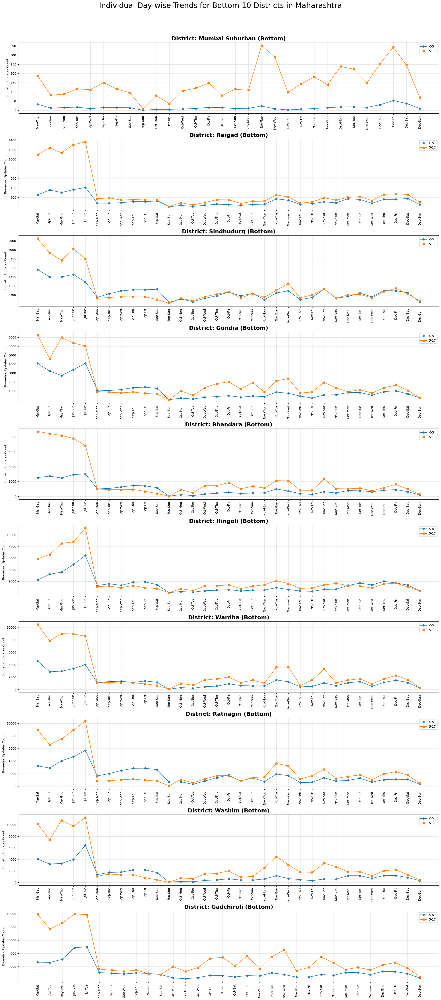

In [50]:
plot_state_district_bottom_day_trends("Maharashtra")

In [59]:
# Define Chronological Orders
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
month_order = ["January", "February", "March", "April", "May", "June", 
               "July", "August", "September", "October", "November", "December"]

# Convert to ordered categorical for proper plotting
df["month_name"] = pd.Categorical(df["month_name"], categories=month_order, ordered=True)
df["day_of_week"] = pd.Categorical(df["day_of_week"], categories=day_order, ordered=True)

def generate_bottom_district_monthly_day_plots(state_name):
    # Filter for the state and find bottom 10 districts
    state_df = df[df['state'] == state_name]
    district_agg = state_df.groupby('district')['total_biometric_updates'].sum().reset_index()
    
    # Use nsmallest to get bottom 10 districts
    bottom_10_districts = district_agg.nsmallest(10, 'total_biometric_updates')['district'].tolist()
    
    # Process each district individually
    for dist in bottom_10_districts:
        dist_df = state_df[state_df['district'] == dist]
        
        # Create a 4x3 grid for the 12 months
        fig, axes = plt.subplots(4, 3, figsize=(20, 20))
        fig.suptitle(f'12-Month Day-wise Analysis (Bottom District): {dist} ({state_name})', 
                     fontsize=26, fontweight='bold', y=1.03)
        axes = axes.flatten()
        
        for i, month in enumerate(month_order):
            ax = axes[i]
            
            # Filter and aggregate for this month
            month_data = dist_df[dist_df['month_name'] == month]
            day_data = month_data.groupby('day_of_week', observed=True)[["bio_age_17_", "bio_age_5_17"]].sum()
            
            # Ensure all 7 days are represented on the axis
            day_data_full = day_data.reindex(day_order).fillna(0).reset_index()
            
            # Plot age groups
            ax.plot(day_data_full['day_of_week'], day_data_full['bio_age_17_'], marker='o', label='0-5', color='#3498db')
            ax.plot(day_data_full['day_of_week'], day_data_full['bio_age_5_17'], marker='s', label='5-17', color='#e67e22')
    

            ax.set_title(month, fontsize=16, fontweight='bold')
            ax.tick_params(axis='x', rotation=45)
            ax.grid(True, alpha=0.3)
            ax.set_ylim(bottom=0)
            if i == 0: ax.legend()
        
        plt.tight_layout()
        plt.savefig(f'bottom_analysis_{dist.replace(" ", "_")}.png', bbox_inches='tight')
        plt.show()


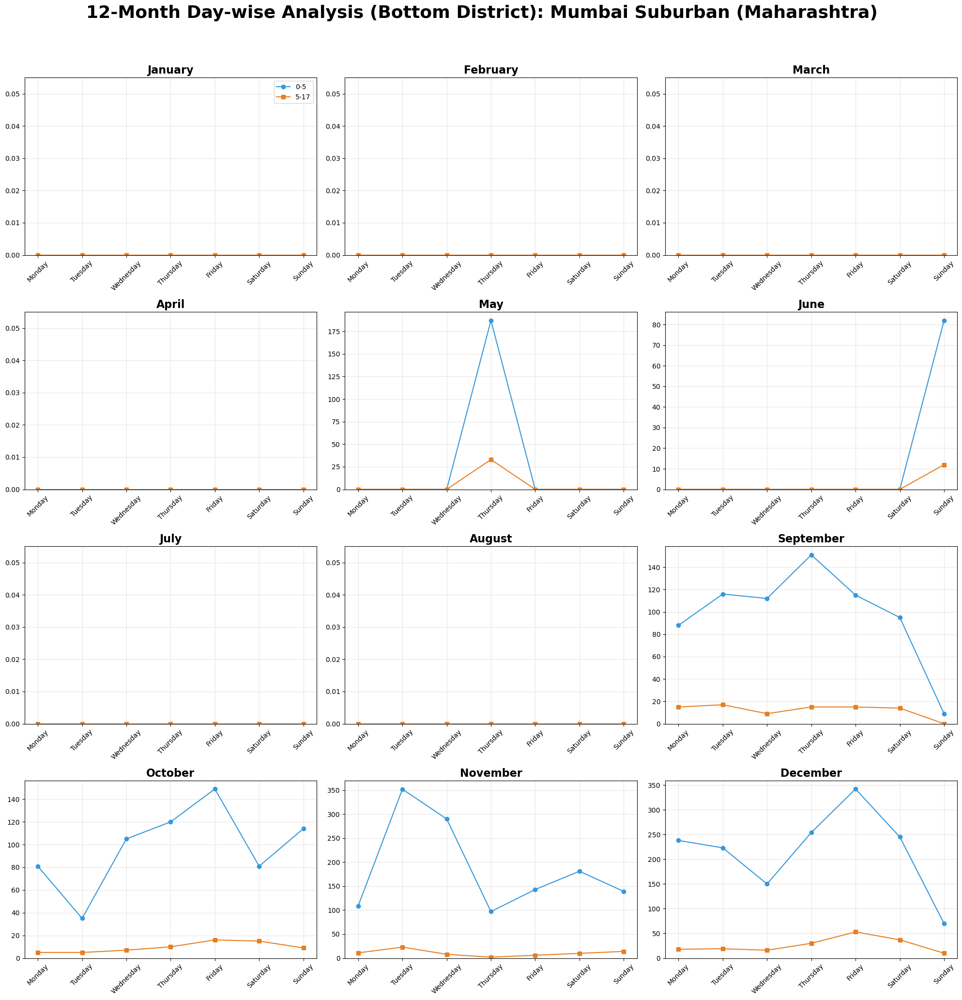

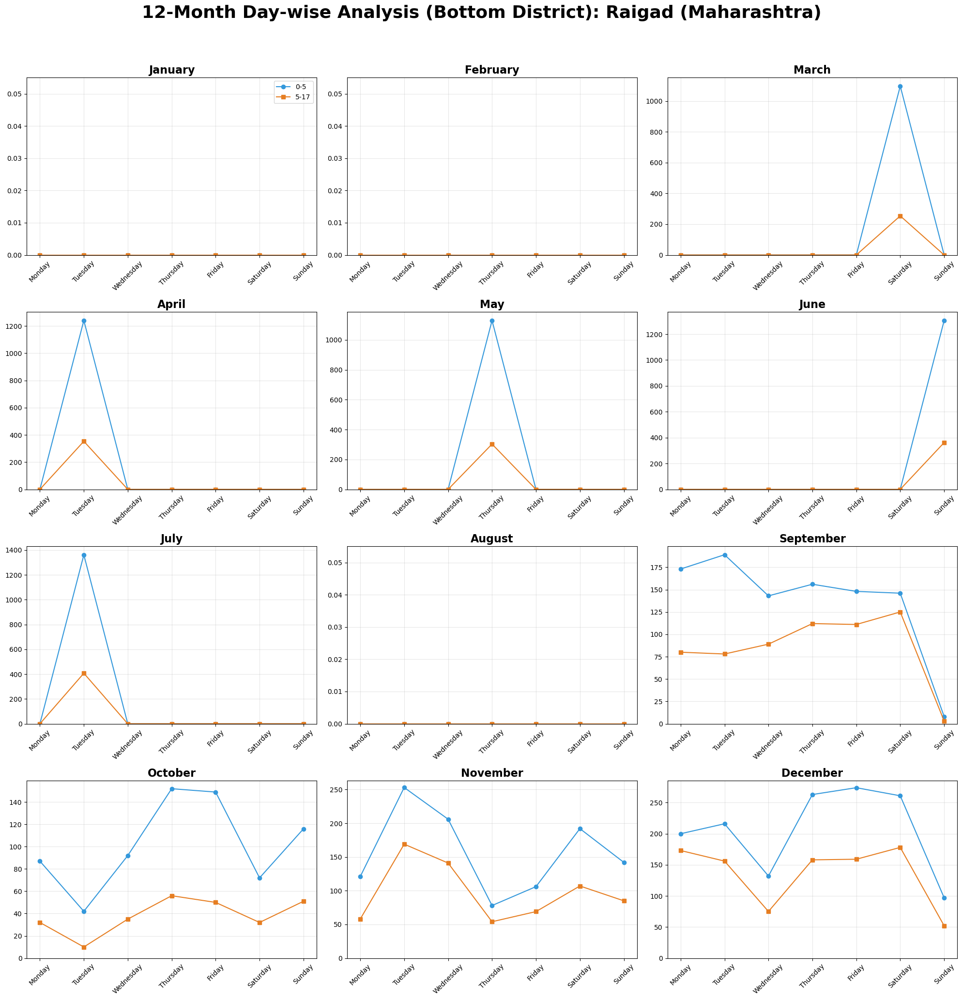

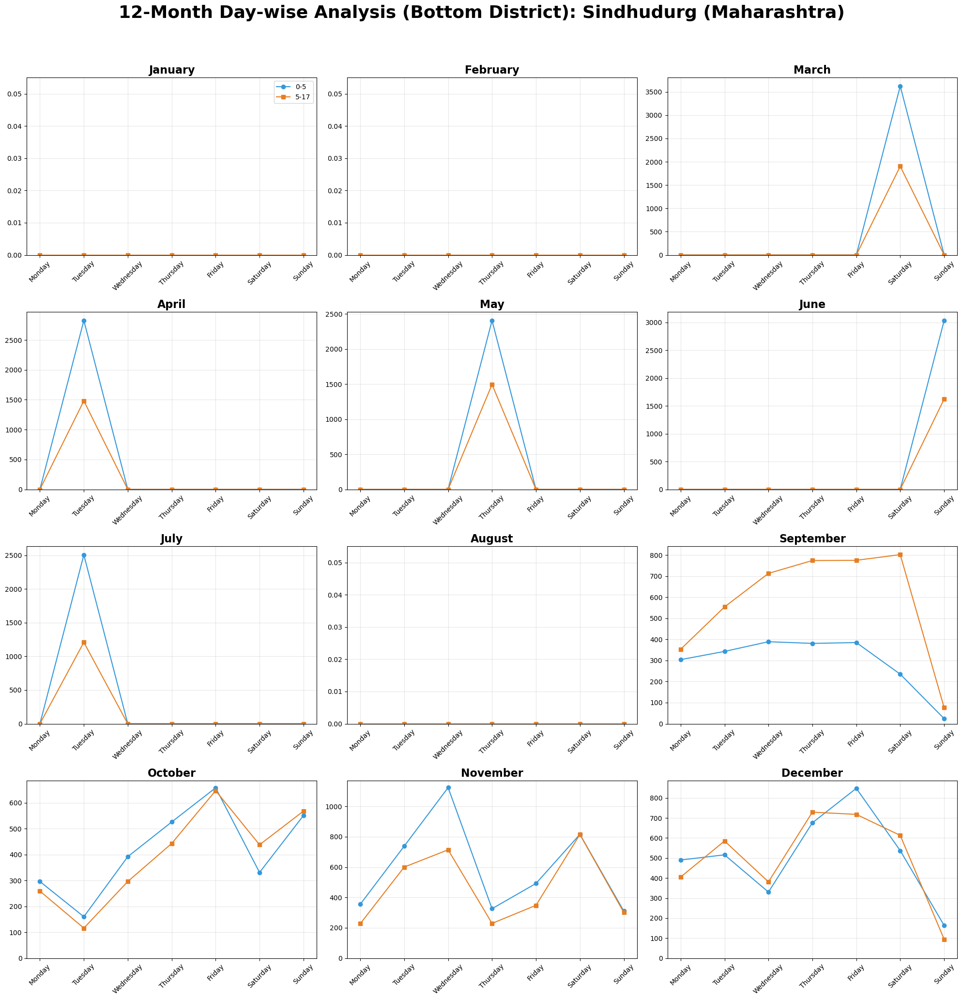

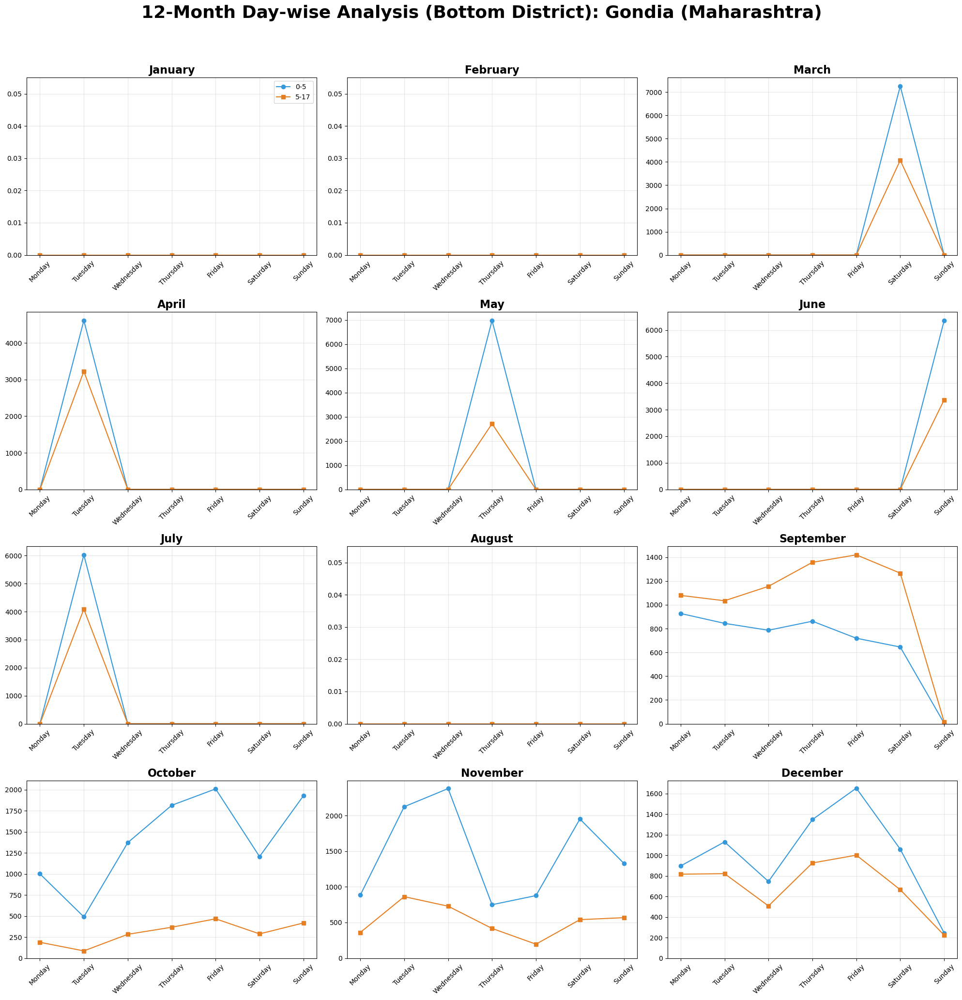

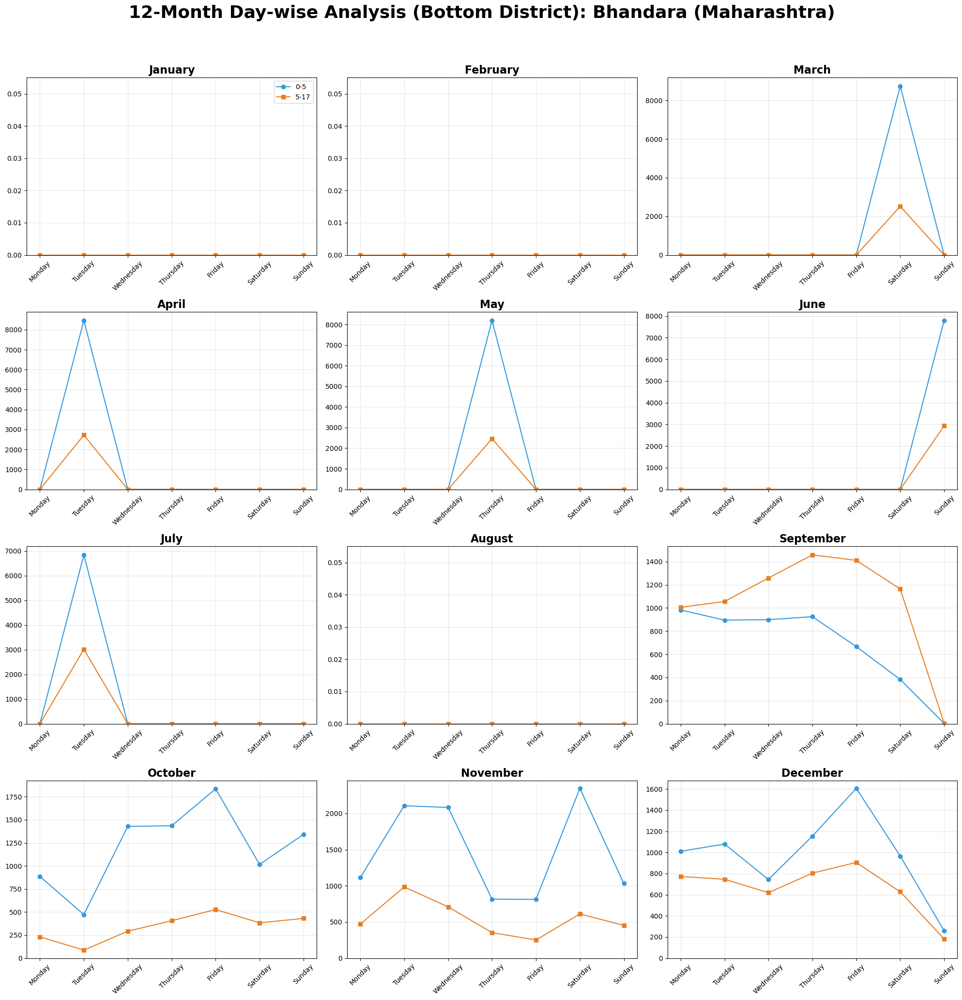

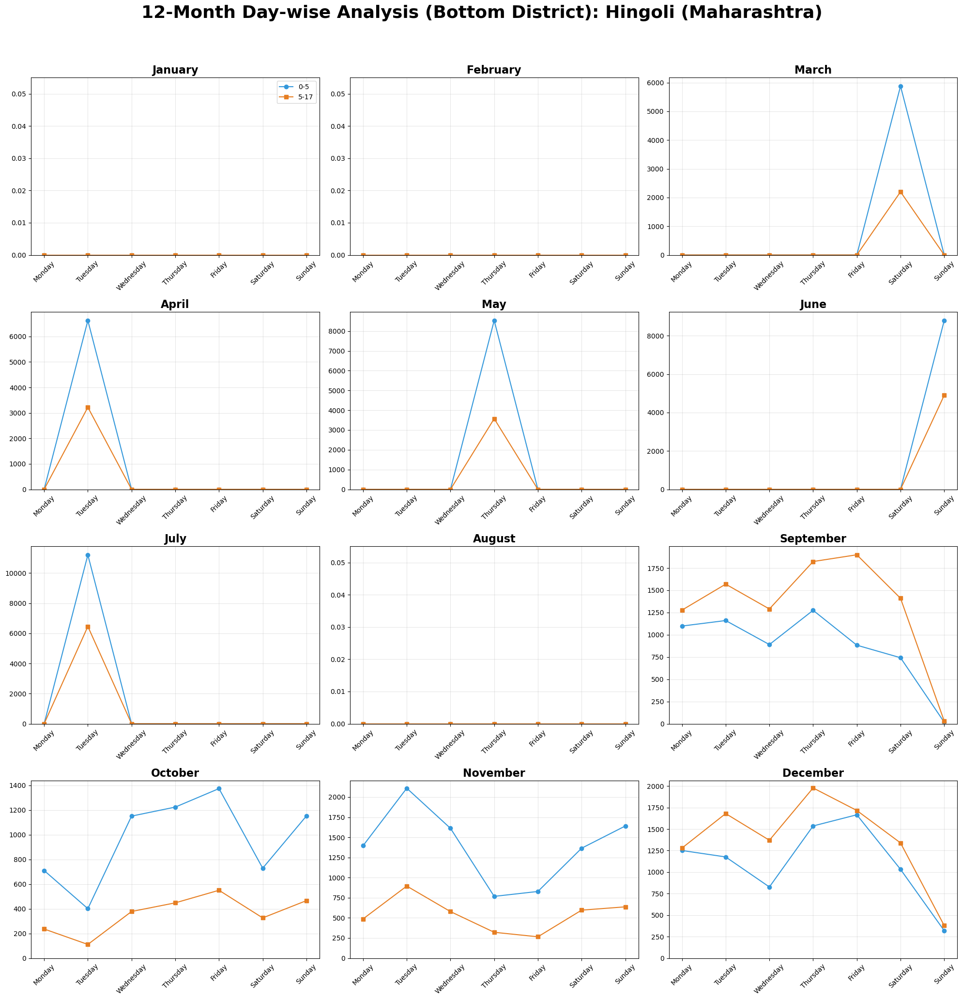

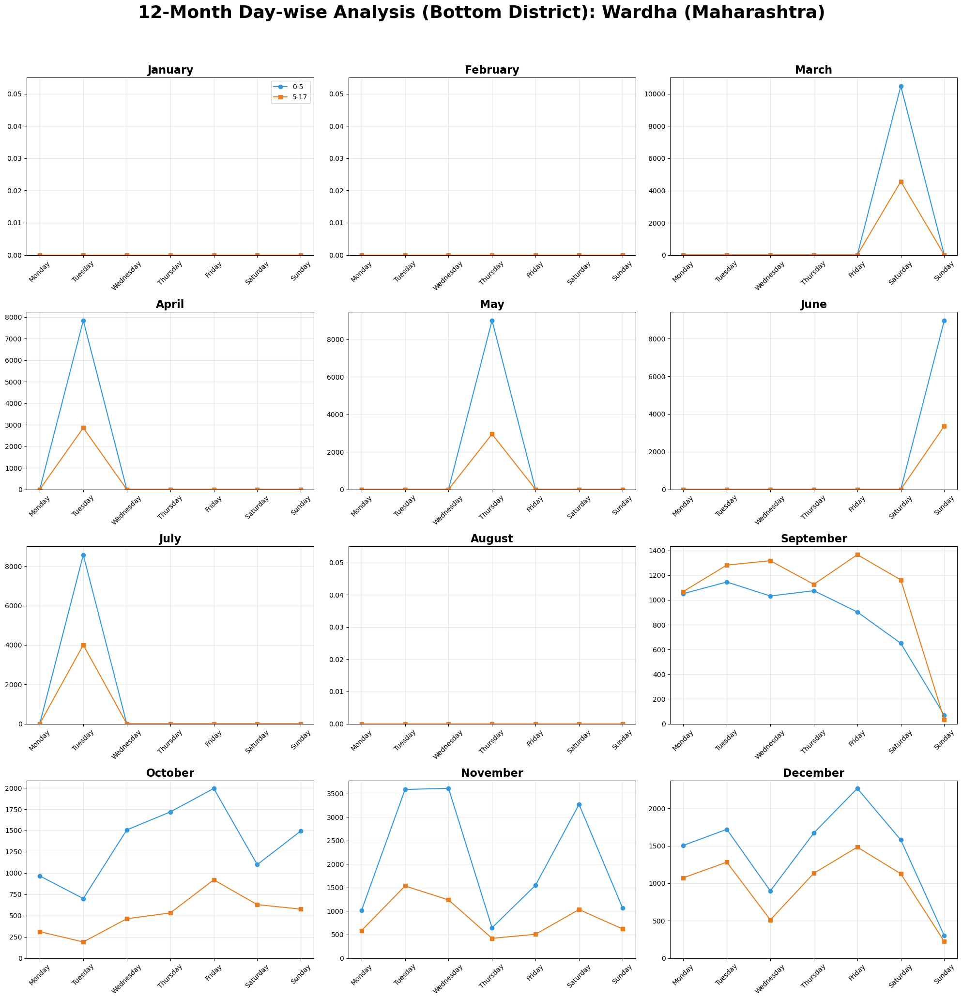

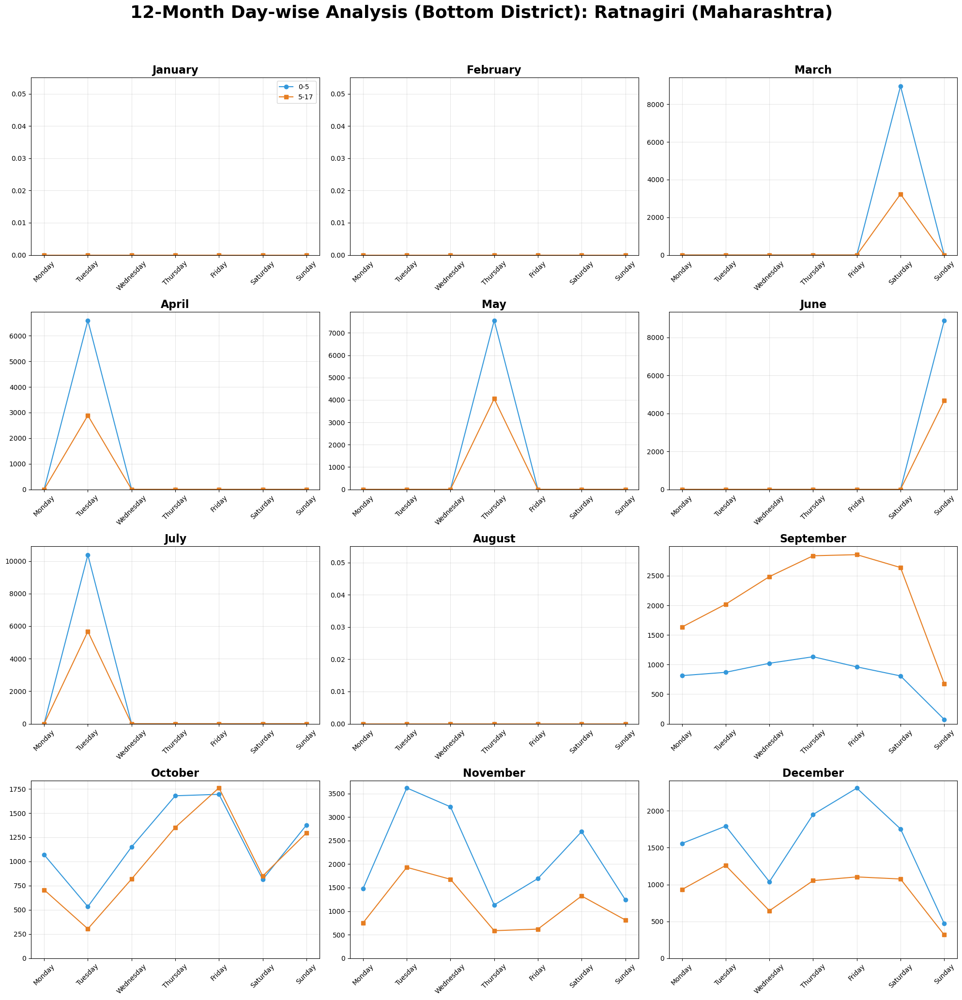

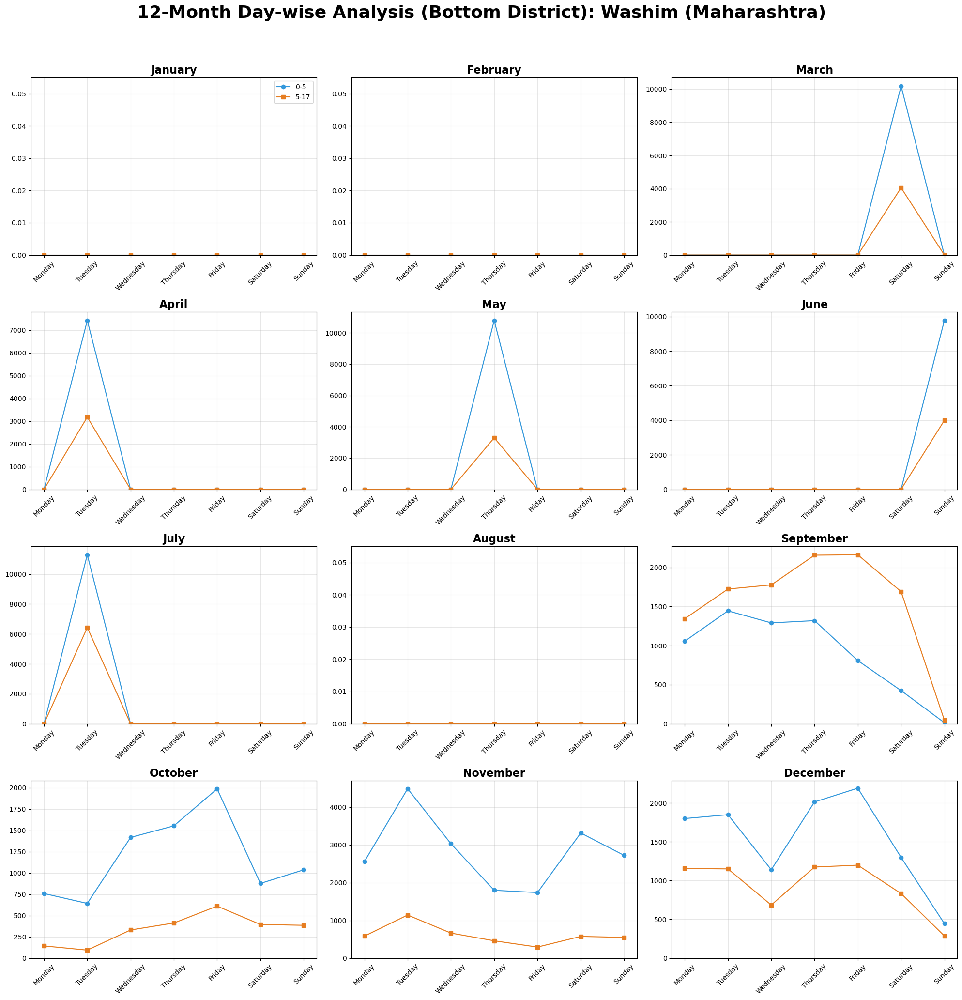

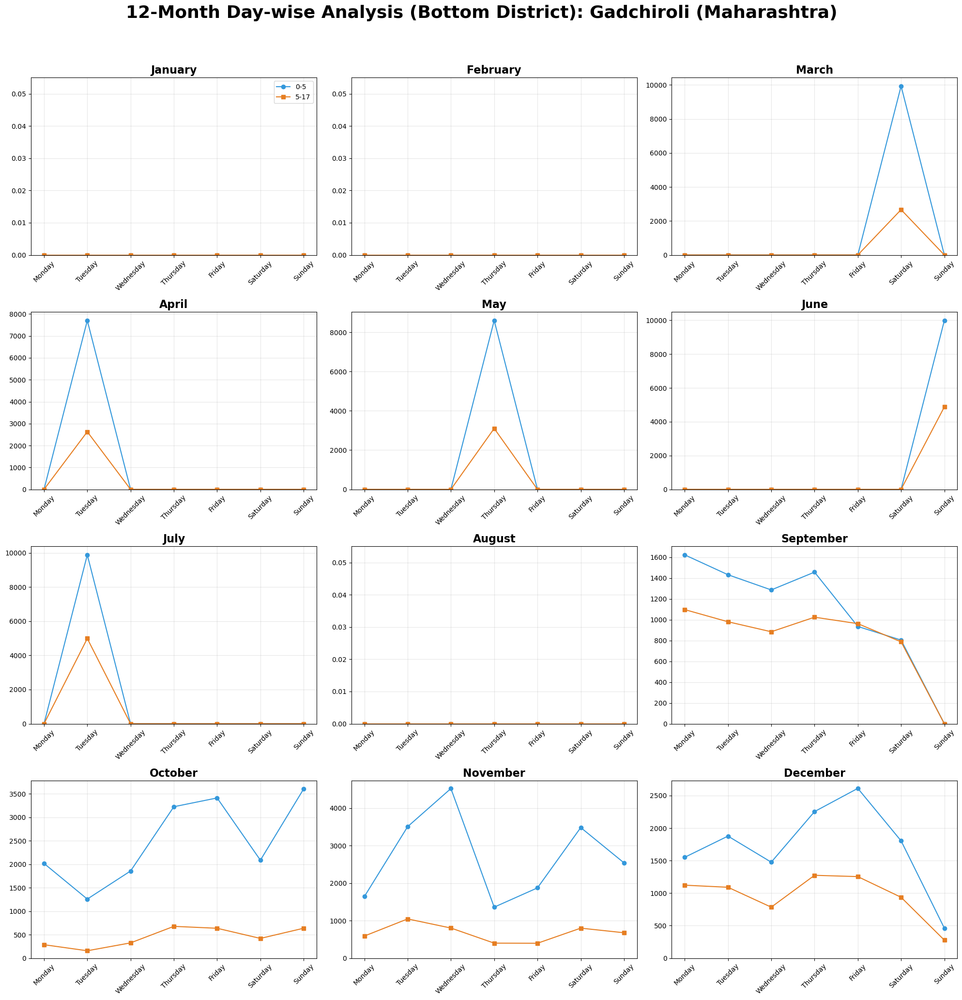

In [60]:
generate_bottom_district_monthly_day_plots("Maharashtra")